In [1]:
import seaborn as sns
import numpy as np
import pandas as pd
import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib.dates import (YEARLY, DateFormatter,
                              rrulewrapper, RRuleLocator, drange)
import datetime   # package that helps manipulate dates
import matplotlib.dates as mdates
import calendar

from dateutil.parser import parse     # package for date parsing
from prophet import Prophet
from pmdarima import auto_arima




# Aqicn data

If you are working with data from aqicn.org, then you need to run this code before using rolling_prophet_forcast_CI_with arima.

In [2]:
def change_df (df):
    data = df.copy()
    data.date = pd.to_datetime(data.date)
    data = data.sort_values(by ='date', ascending= False)

    data.columns = ['date','PM25','PM10','O3','NO2','SO2','CO']

    for col in data.columns:
        if col != 'date':
            data[col] = pd.to_numeric(data[col], errors ='coerce')
    data = data.dropna()
    data = data.sort_values('date', ascending =False)
    return data




# Nasa data

If you are working with data from NASA, then you need to run this code before using rolling_prophet_forcast_CI_with_arima.

In [3]:
def cleaning_NASA_data(a, pollutant):
    """
    Cleans NASA CSV data: renames columns, drops metadata rows, converts types, sorts by date,
    and filters for positive values of the pollutant.
    """
    a.columns = ['date', pollutant]
    a.drop(list(range(0, 7)), inplace=True)  # drops first 7 rows, adjust if necessary
    a[pollutant] = pd.to_numeric(a[pollutant], errors='coerce')
    a['date'] = pd.to_datetime(a['date'])
    a = a.sort_values('date')
    a = a[a[pollutant] > 0]
    a = a.reset_index(drop=True)
    return a


# Prophet + ARIMA

In [4]:
def make_agg(df, freq='D', pollutant='NO2'):
    df_agg = df.copy()
    df_agg['date'] = pd.to_datetime(df_agg['date'])
    if freq == 'D':
        df_agg = df_agg[['date', pollutant]]
        return df_agg.rename(columns={pollutant:  pollutant})
    elif freq == 'W':
        df_agg['date'] = df_agg['date'].dt.to_period('W').dt.start_time
        result = df_agg.groupby('date')[pollutant].mean().reset_index()
        return result.rename(columns={pollutant:  pollutant})
    elif freq == 'M':
        df_agg['date'] = df_agg['date'].dt.to_period('M').dt.start_time
        result = df_agg.groupby('date')[pollutant].mean().reset_index()
        return result.rename(columns={pollutant:  pollutant })
    else:
        raise ValueError("freq must be 'D', 'W', or 'M'")

In [5]:
from pmdarima import auto_arima

def rolling_prophet_forecast_CI_with_arima(
    df, pollutant='no2', train_steps=730, test_steps=30, step=30, z_thresh=3, freq='D', plot=True
):
    # Prophet rolling
    df = df.sort_values('date').reset_index(drop=True)
    df_prophet = df.rename(columns={'date':'ds', pollutant:'y'})[['ds','y']].dropna()
    results = []
    for train_end in range(train_steps, len(df_prophet)-test_steps+1, step):
        train = df_prophet.iloc[:train_end]
        test  = df_prophet.iloc[train_end:train_end+test_steps]
        m = Prophet(yearly_seasonality=True, weekly_seasonality=(freq!='M'), daily_seasonality=(freq=='D'), interval_width=0.95)
        m.fit(train)
        fcst = m.predict(test[['ds']])
        pred = fcst['yhat'].values
        lower = fcst['yhat_lower'].values
        upper = fcst['yhat_upper'].values
        y_true = test['y'].values
        for i in range(len(pred)):
            results.append({
                'ds': test['ds'].values[i],
                'real': y_true[i],
                'prophet_pred': pred[i],
                'lower_CI': lower[i],
                'upper_CI': upper[i]
            })
        del m

    results_df = pd.DataFrame(results)
    results_df = results_df.drop_duplicates(subset=['ds'])
    # Prophet residual
    results_df['residual'] = results_df['real'] - results_df['prophet_pred']
    # ARIMA modification
    arima_mod = auto_arima(results_df['residual'].values, seasonal=False, suppress_warnings=True, stepwise=True, error_action='ignore')
    arima_pred = arima_mod.predict_in_sample()
    results_df['arima_correction'] = arima_pred
    results_df['final_pred'] = results_df['prophet_pred'] + arima_pred
    results_df['arima_residual'] = results_df['real'] - results_df['final_pred']
    sigma = results_df['arima_residual'].std()
    results_df['zscore'] = results_df['arima_residual'] / sigma if sigma > 0 else 0
    results_df['outlier'] = np.abs(results_df['zscore']) > z_thresh

    if plot:
        plt.figure(figsize=(15,5))
        plt.plot(results_df['ds'], results_df['real'], color='gray', alpha=0.4, label='Observed')
        plt.plot(results_df['ds'], results_df['final_pred'], color='blue', label='Prophet(rolling)+ARIMA')
        plt.fill_between(results_df['ds'], results_df['lower_CI'], results_df['upper_CI'], color='skyblue', alpha=0.18, label='Prophet 95% CI')
        plt.scatter(results_df.loc[results_df['outlier'], 'ds'],
                    results_df.loc[results_df['outlier'], 'real'],
                    color='red', s=32, label=f'Anomaly (|z|>{z_thresh})')
        plt.xlabel('Date'); plt.ylabel(pollutant.upper())
        plt.title(f'Prophet(rolling)+ARIMA: Prediction, CI, Residual, Anomaly [{freq}]')
        plt.legend(); plt.tight_layout(); plt.show()

    return results_df



In [6]:
def plot_arima_anomaly_band(results_df, pollutant='NO2', shading_k=3, z_thresh=3, freq='D'):
    """
    results_df: DataFrame with columns ['ds', 'real', 'final_pred', 'arima_residual', 'outlier']
    """
    sigma = results_df['arima_residual'].std()
    # confidence interval
    lower = results_df['final_pred'] - shading_k * sigma
    upper = results_df['final_pred'] + shading_k * sigma

    plt.figure(figsize=(15,5))
    plt.plot(results_df['ds'], results_df['real'], color='gray', alpha=0.4, label='Observed')
    plt.plot(results_df['ds'], results_df['final_pred'], color='blue', label='Prophet(rolling)+ARIMA')
    plt.fill_between(results_df['ds'], lower, upper, color='skyblue', alpha=0.18, label=f'Prophet+ARIMA ±{shading_k}σ')
    plt.scatter(results_df.loc[results_df['outlier'], 'ds'],
                results_df.loc[results_df['outlier'], 'real'],
                color='red', s=32, label=f'Anomaly (|z|>{z_thresh})')
    plt.xlabel('Date'); plt.ylabel(pollutant.upper())
    plt.title(f'Prophet(rolling)+ARIMA: Prediction, Anomaly Band, Outlier [{freq}]')
    plt.legend(); plt.tight_layout(); plt.show()

In [7]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.stats.diagnostic import acorr_ljungbox
import matplotlib.pyplot as plt

def residual_diagnostics(res_df, lags=[10, 20, 30], title=''):
    resid = res_df['arima_residual'].values
    max_lags = min(max(lags), len(resid)//2 - 1)  # 데이터 길이에 맞춰 최대 lags 제한
    lags_to_use = [lag for lag in lags if lag <= max_lags]
    
    import matplotlib.pyplot as plt
    from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
    from statsmodels.stats.diagnostic import acorr_ljungbox

    plt.figure(figsize=(12,4))
    plt.subplot(1,2,1)
    plot_acf(resid, lags=max_lags, zero=False, ax=plt.gca())
    plt.title(f'ACF {title}')
    plt.subplot(1,2,2)
    plot_pacf(resid, lags=max_lags, zero=False, ax=plt.gca())
    plt.title(f'PACF {title}')
    plt.tight_layout()
    plt.show()

    lb = acorr_ljungbox(resid, lags=lags_to_use, return_df=True)
    print(f'Ljung-Box Test {title} (using lags {lags_to_use}):\n{lb}\n')


# Caofeidan Port

In [8]:
df_cfd_NASA = pd.read_csv("data/Port_NO2/Caofeidian_Port.csv")
df_cfd_NASA = cleaning_NASA_data(df_cfd_NASA,'NO2')

00:20:04 - cmdstanpy - INFO - Chain [1] start processing
00:20:04 - cmdstanpy - INFO - Chain [1] done processing
00:20:04 - cmdstanpy - INFO - Chain [1] start processing
00:20:04 - cmdstanpy - INFO - Chain [1] done processing
00:20:04 - cmdstanpy - INFO - Chain [1] start processing
00:20:04 - cmdstanpy - INFO - Chain [1] done processing
00:20:04 - cmdstanpy - INFO - Chain [1] start processing
00:20:04 - cmdstanpy - INFO - Chain [1] done processing
00:20:04 - cmdstanpy - INFO - Chain [1] start processing
00:20:04 - cmdstanpy - INFO - Chain [1] done processing
00:20:05 - cmdstanpy - INFO - Chain [1] start processing
00:20:05 - cmdstanpy - INFO - Chain [1] done processing
00:20:05 - cmdstanpy - INFO - Chain [1] start processing
00:20:05 - cmdstanpy - INFO - Chain [1] done processing
00:20:05 - cmdstanpy - INFO - Chain [1] start processing
00:20:05 - cmdstanpy - INFO - Chain [1] done processing
00:20:05 - cmdstanpy - INFO - Chain [1] start processing
00:20:05 - cmdstanpy - INFO - Chain [1]

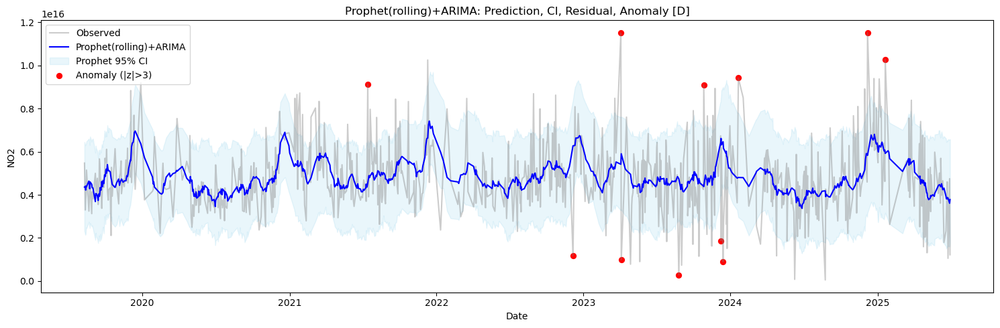

00:20:12 - cmdstanpy - INFO - Chain [1] start processing
00:20:12 - cmdstanpy - INFO - Chain [1] done processing
00:20:12 - cmdstanpy - INFO - Chain [1] start processing
00:20:12 - cmdstanpy - INFO - Chain [1] done processing
00:20:12 - cmdstanpy - INFO - Chain [1] start processing
00:20:12 - cmdstanpy - INFO - Chain [1] done processing
00:20:12 - cmdstanpy - INFO - Chain [1] start processing
00:20:13 - cmdstanpy - INFO - Chain [1] done processing
00:20:13 - cmdstanpy - INFO - Chain [1] start processing
00:20:13 - cmdstanpy - INFO - Chain [1] done processing
00:20:13 - cmdstanpy - INFO - Chain [1] start processing
00:20:13 - cmdstanpy - INFO - Chain [1] done processing
00:20:13 - cmdstanpy - INFO - Chain [1] start processing
00:20:13 - cmdstanpy - INFO - Chain [1] done processing
00:20:13 - cmdstanpy - INFO - Chain [1] start processing
00:20:13 - cmdstanpy - INFO - Chain [1] done processing
00:20:13 - cmdstanpy - INFO - Chain [1] start processing
00:20:13 - cmdstanpy - INFO - Chain [1]

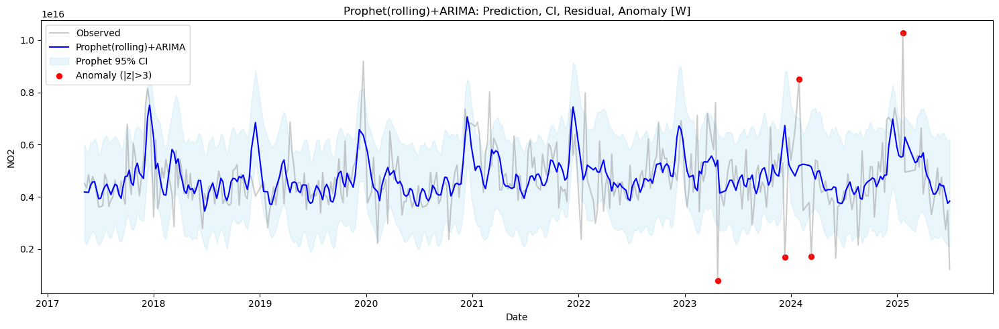

00:20:31 - cmdstanpy - INFO - Chain [1] start processing
00:20:31 - cmdstanpy - INFO - Chain [1] done processing
00:20:31 - cmdstanpy - INFO - Chain [1] start processing
00:20:32 - cmdstanpy - INFO - Chain [1] done processing
00:20:32 - cmdstanpy - INFO - Chain [1] start processing
00:20:32 - cmdstanpy - INFO - Chain [1] done processing
00:20:32 - cmdstanpy - INFO - Chain [1] start processing
00:20:32 - cmdstanpy - INFO - Chain [1] done processing
00:20:32 - cmdstanpy - INFO - Chain [1] start processing
00:20:33 - cmdstanpy - INFO - Chain [1] done processing
00:20:33 - cmdstanpy - INFO - Chain [1] start processing
00:20:33 - cmdstanpy - INFO - Chain [1] done processing
00:20:33 - cmdstanpy - INFO - Chain [1] start processing
00:20:33 - cmdstanpy - INFO - Chain [1] done processing
00:20:33 - cmdstanpy - INFO - Chain [1] start processing
00:20:34 - cmdstanpy - INFO - Chain [1] done processing
00:20:34 - cmdstanpy - INFO - Chain [1] start processing
00:20:34 - cmdstanpy - INFO - Chain [1]

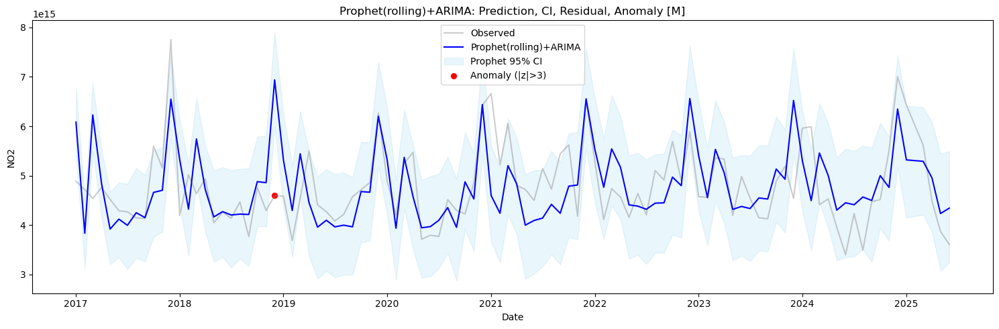

In [9]:
df_cfd_daily_result_nasa = rolling_prophet_forecast_CI_with_arima(
    make_agg(df_cfd_NASA, freq='D',pollutant='NO2'), pollutant='NO2',
    train_steps=730, test_steps=30, step=30, z_thresh=3, freq='D', plot=True
)
df_cfd_weekly_result_nasa = rolling_prophet_forecast_CI_with_arima(
    make_agg(df_cfd_NASA, freq='W',pollutant='NO2'), pollutant='NO2',
    train_steps=156, test_steps=8, step=4, z_thresh=3, freq='W', plot=True
)
df_cfd_monthly_result_nasa = rolling_prophet_forecast_CI_with_arima(
    make_agg(df_cfd_NASA, freq='M',pollutant='NO2'), pollutant='NO2',
    train_steps=36, test_steps=4, step=1, z_thresh=3, freq='M', plot=True
)

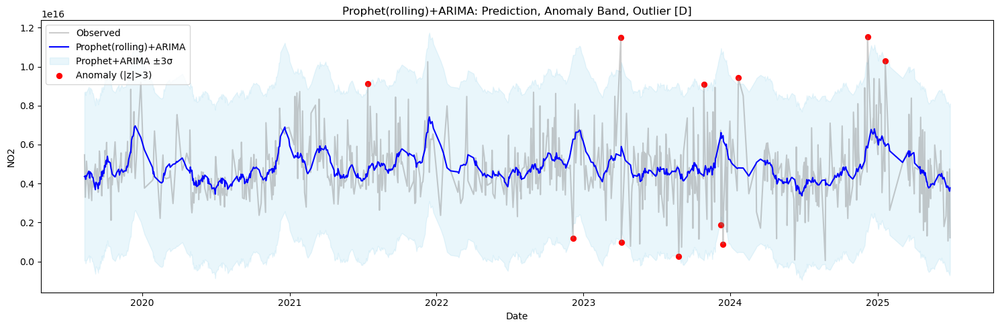

In [10]:
plot_arima_anomaly_band(df_cfd_daily_result_nasa, pollutant='NO2', shading_k=3, z_thresh=3, freq='D')


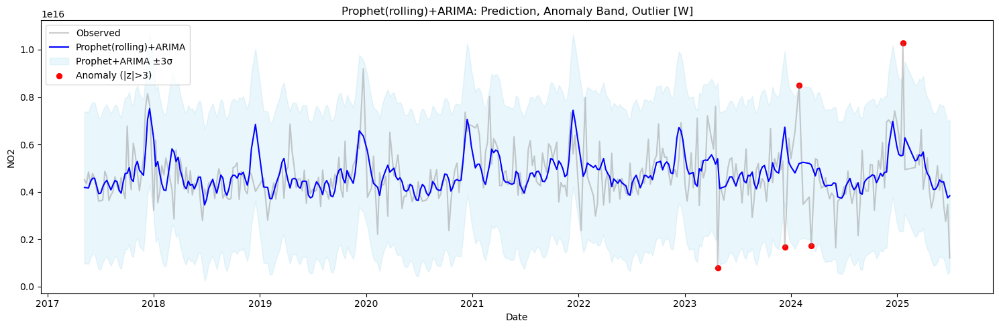

In [11]:
plot_arima_anomaly_band(df_cfd_weekly_result_nasa, pollutant='NO2', shading_k=3, z_thresh=3, freq='W')


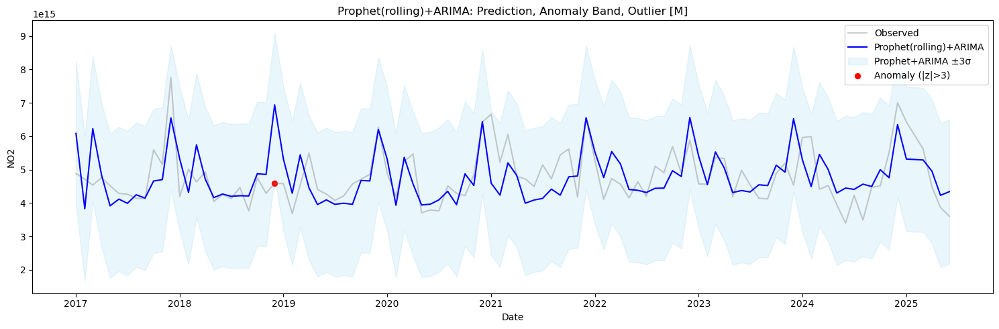

In [12]:
plot_arima_anomaly_band(df_cfd_monthly_result_nasa, pollutant='NO2', shading_k=3, z_thresh=3, freq='M')


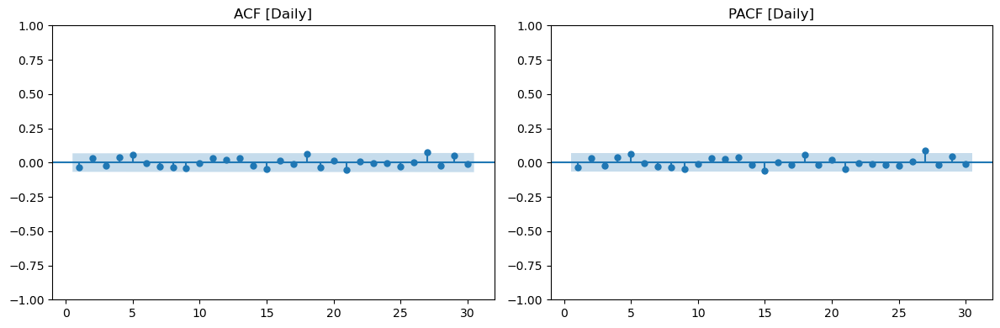

Ljung-Box Test [Daily] (using lags [10, 20, 30]):
      lb_stat  lb_pvalue
10   9.467791   0.488357
20  18.545281   0.551535
30  29.773837   0.477280



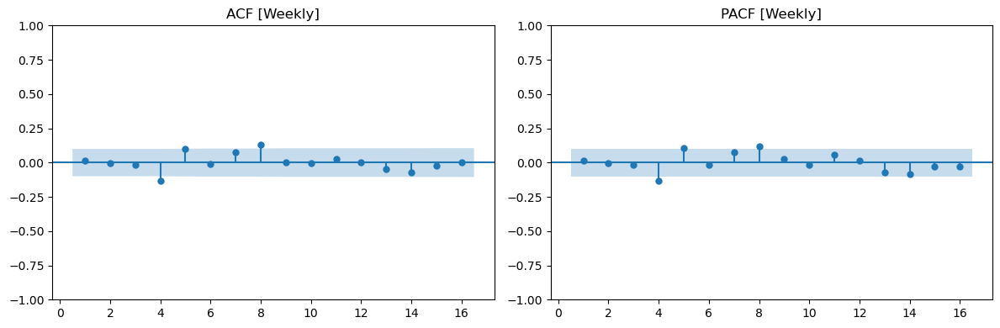

Ljung-Box Test [Weekly] (using lags [8, 12, 16]):
      lb_stat  lb_pvalue
8   20.632254   0.008191
12  20.936561   0.051317
16  24.223544   0.084734



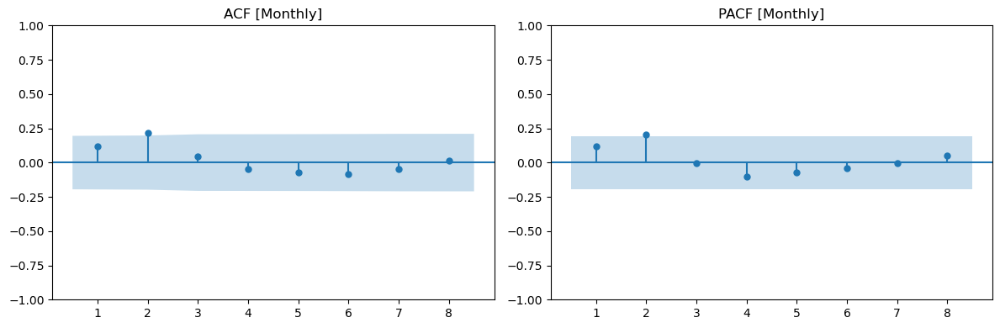

Ljung-Box Test [Monthly] (using lags [4, 8]):
    lb_stat  lb_pvalue
4  6.805642   0.146523
8  8.412905   0.394210



In [13]:
# Daily residual
residual_diagnostics(df_cfd_daily_result_nasa, lags=[10,20,30], title='[Daily]')
# Weekly residual
residual_diagnostics(df_cfd_weekly_result_nasa, lags=[8,12,16], title='[Weekly]')
# Monthly residual
residual_diagnostics(df_cfd_monthly_result_nasa, lags=[4,8], title='[Monthly]')

# Dongwu_Port

In [14]:
df_dgu_NASA = pd.read_csv('data/Port_NO2/Dongwu_Port.csv')
df_dgu_NASA = cleaning_NASA_data(df_dgu_NASA,'NO2')

00:21:32 - cmdstanpy - INFO - Chain [1] start processing
00:21:32 - cmdstanpy - INFO - Chain [1] done processing
00:21:33 - cmdstanpy - INFO - Chain [1] start processing
00:21:33 - cmdstanpy - INFO - Chain [1] done processing
00:21:33 - cmdstanpy - INFO - Chain [1] start processing
00:21:33 - cmdstanpy - INFO - Chain [1] done processing
00:21:33 - cmdstanpy - INFO - Chain [1] start processing
00:21:33 - cmdstanpy - INFO - Chain [1] done processing
00:21:33 - cmdstanpy - INFO - Chain [1] start processing
00:21:33 - cmdstanpy - INFO - Chain [1] done processing
00:21:34 - cmdstanpy - INFO - Chain [1] start processing
00:21:34 - cmdstanpy - INFO - Chain [1] done processing
00:21:34 - cmdstanpy - INFO - Chain [1] start processing
00:21:34 - cmdstanpy - INFO - Chain [1] done processing
00:21:34 - cmdstanpy - INFO - Chain [1] start processing
00:21:34 - cmdstanpy - INFO - Chain [1] done processing
00:21:34 - cmdstanpy - INFO - Chain [1] start processing
00:21:34 - cmdstanpy - INFO - Chain [1]

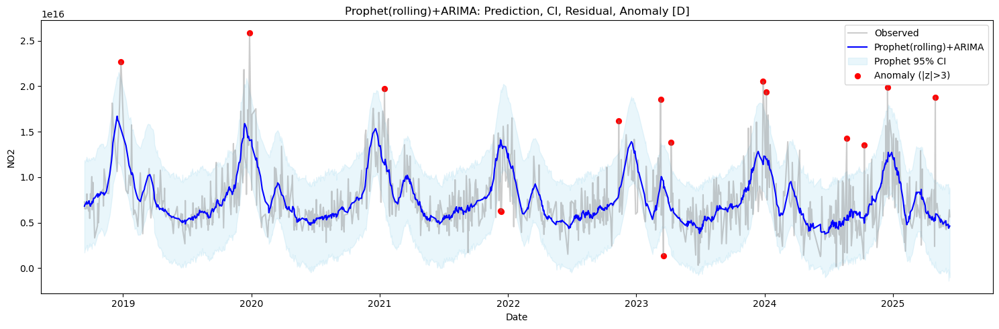

00:21:43 - cmdstanpy - INFO - Chain [1] start processing
00:21:43 - cmdstanpy - INFO - Chain [1] done processing
00:21:43 - cmdstanpy - INFO - Chain [1] start processing
00:21:43 - cmdstanpy - INFO - Chain [1] done processing
00:21:44 - cmdstanpy - INFO - Chain [1] start processing
00:21:44 - cmdstanpy - INFO - Chain [1] done processing
00:21:44 - cmdstanpy - INFO - Chain [1] start processing
00:21:44 - cmdstanpy - INFO - Chain [1] done processing
00:21:44 - cmdstanpy - INFO - Chain [1] start processing
00:21:44 - cmdstanpy - INFO - Chain [1] done processing
00:21:44 - cmdstanpy - INFO - Chain [1] start processing
00:21:44 - cmdstanpy - INFO - Chain [1] done processing
00:21:44 - cmdstanpy - INFO - Chain [1] start processing
00:21:44 - cmdstanpy - INFO - Chain [1] done processing
00:21:45 - cmdstanpy - INFO - Chain [1] start processing
00:21:45 - cmdstanpy - INFO - Chain [1] done processing
00:21:45 - cmdstanpy - INFO - Chain [1] start processing
00:21:45 - cmdstanpy - INFO - Chain [1]

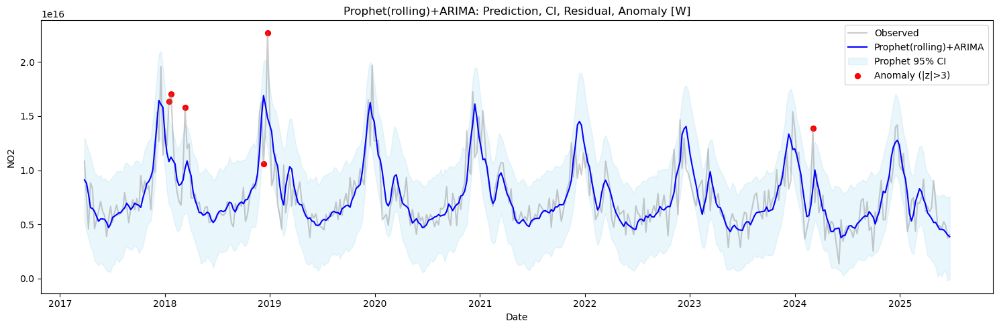

00:22:03 - cmdstanpy - INFO - Chain [1] start processing
00:22:03 - cmdstanpy - INFO - Chain [1] done processing
00:22:04 - cmdstanpy - INFO - Chain [1] start processing
00:22:04 - cmdstanpy - INFO - Chain [1] done processing
00:22:04 - cmdstanpy - INFO - Chain [1] start processing
00:22:04 - cmdstanpy - INFO - Chain [1] done processing
00:22:04 - cmdstanpy - INFO - Chain [1] start processing
00:22:04 - cmdstanpy - INFO - Chain [1] done processing
00:22:05 - cmdstanpy - INFO - Chain [1] start processing
00:22:05 - cmdstanpy - INFO - Chain [1] done processing
00:22:05 - cmdstanpy - INFO - Chain [1] start processing
00:22:05 - cmdstanpy - INFO - Chain [1] done processing
00:22:05 - cmdstanpy - INFO - Chain [1] start processing
00:22:06 - cmdstanpy - INFO - Chain [1] done processing
00:22:06 - cmdstanpy - INFO - Chain [1] start processing
00:22:06 - cmdstanpy - INFO - Chain [1] done processing
00:22:06 - cmdstanpy - INFO - Chain [1] start processing
00:22:06 - cmdstanpy - INFO - Chain [1]

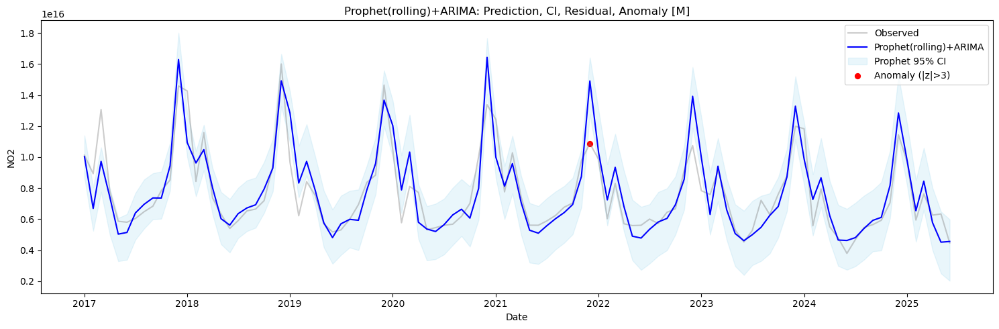

In [15]:
df_dgu_daily_result_nasa = rolling_prophet_forecast_CI_with_arima(
    make_agg(df_dgu_NASA, freq='D',pollutant='NO2'), pollutant='NO2',
    train_steps=730, test_steps=30, step=30, z_thresh=3, freq='D', plot=True
)
df_dgu_weekly_result_nasa = rolling_prophet_forecast_CI_with_arima(
    make_agg(df_dgu_NASA, freq='W',pollutant='NO2'), pollutant='NO2',
    train_steps=156, test_steps=8, step=4, z_thresh=3, freq='W', plot=True
)
df_dgu_monthly_result_nasa = rolling_prophet_forecast_CI_with_arima(
    make_agg(df_dgu_NASA, freq='M',pollutant='NO2'), pollutant='NO2',
    train_steps=36, test_steps=4, step=1, z_thresh=3, freq='M', plot=True
)

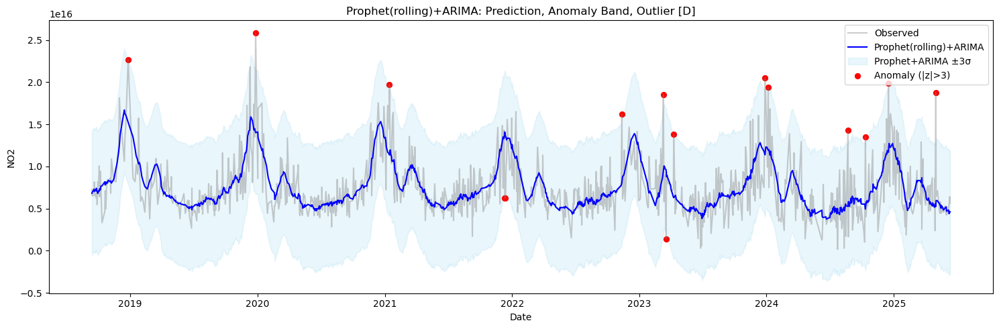

In [16]:
plot_arima_anomaly_band(df_dgu_daily_result_nasa, pollutant='NO2', shading_k=3, z_thresh=3, freq='D')


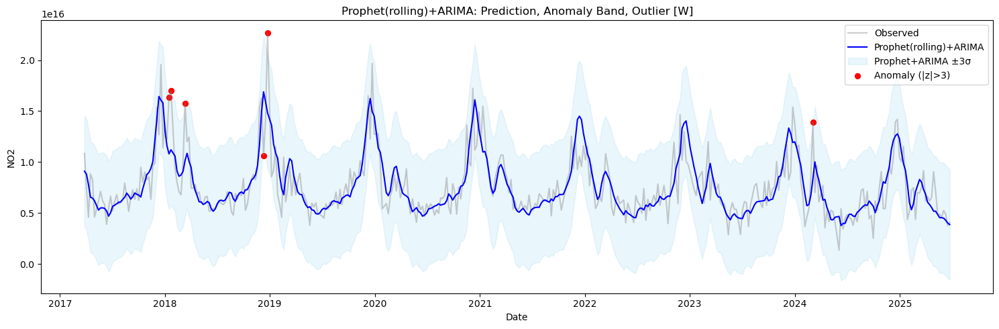

In [17]:
plot_arima_anomaly_band(df_dgu_weekly_result_nasa, pollutant='NO2', shading_k=3, z_thresh=3, freq='W')


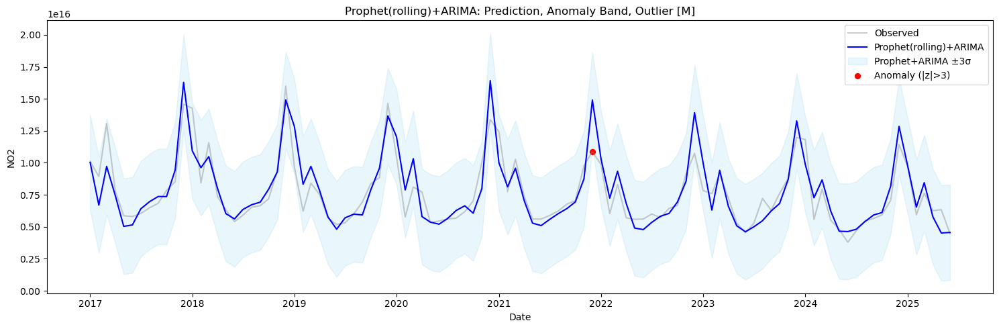

In [18]:
plot_arima_anomaly_band(df_dgu_monthly_result_nasa, pollutant='NO2', shading_k=3, z_thresh=3, freq='M')


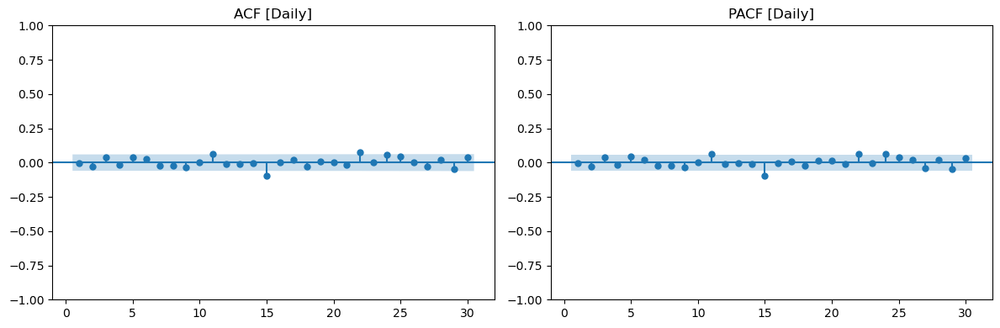

Ljung-Box Test [Daily] (using lags [10, 20, 30]):
      lb_stat  lb_pvalue
10   7.478199   0.679659
20  24.147342   0.236015
30  41.910342   0.072848



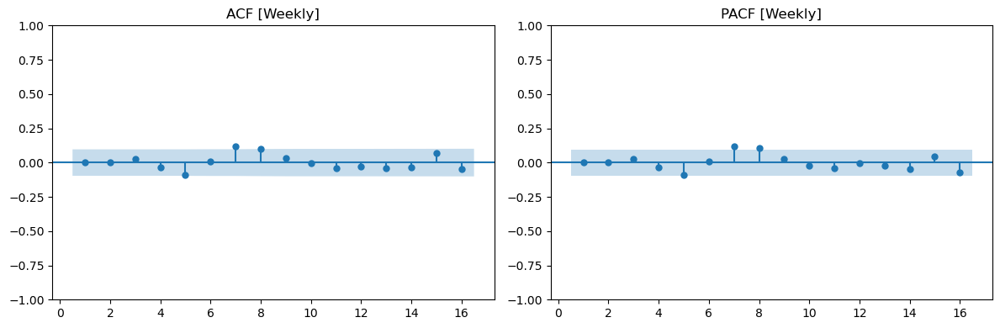

Ljung-Box Test [Weekly] (using lags [8, 12, 16]):
      lb_stat  lb_pvalue
8   14.149547   0.077950
12  15.817643   0.199732
16  20.206389   0.211068



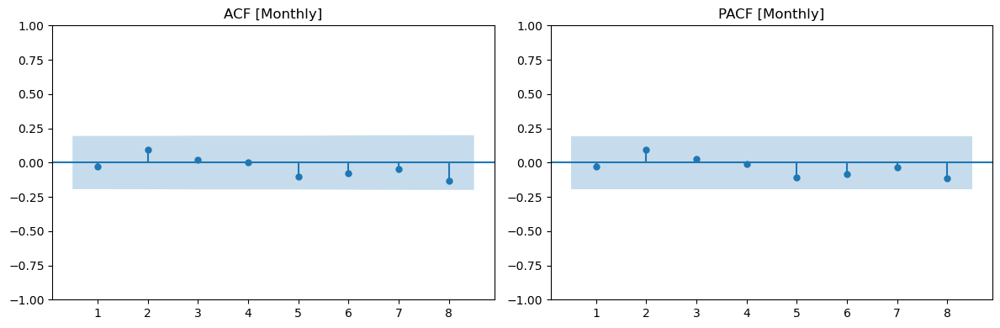

Ljung-Box Test [Monthly] (using lags [4, 8]):
    lb_stat  lb_pvalue
4  1.050847   0.901990
8  5.113624   0.745366



In [19]:
# Daily residual
residual_diagnostics(df_dgu_daily_result_nasa, lags=[10,20,30], title='[Daily]')
# Weekly residual
residual_diagnostics(df_dgu_weekly_result_nasa, lags=[8,12,16], title='[Weekly]')
# Monthly residual
residual_diagnostics(df_dgu_monthly_result_nasa, lags=[4,8], title='[Monthly]')

# Fangcheng Port

In [25]:
df_fcg_NASA = pd.read_csv('data/Port_NO2/Fangcheng_Port.csv')
df_fcg_NASA = cleaning_NASA_data(df_fcg_NASA,'NO2')
df_fcg_NASA

,date,NO2
0,2014-01-05,0.265
1,2014-01-14,0.280
2,2014-01-21,0.390
3,2014-02-20,0.145
4,2014-04-02,0.045
...,...,...
523,2025-05-14,0.090
524,2025-05-23,0.085
525,2025-06-02,0.425
526,2025-06-07,0.165


00:25:45 - cmdstanpy - INFO - Chain [1] start processing
00:25:45 - cmdstanpy - INFO - Chain [1] done processing
00:25:45 - cmdstanpy - INFO - Chain [1] start processing
00:25:45 - cmdstanpy - INFO - Chain [1] done processing
00:25:45 - cmdstanpy - INFO - Chain [1] start processing
00:25:45 - cmdstanpy - INFO - Chain [1] done processing
00:25:45 - cmdstanpy - INFO - Chain [1] start processing
00:25:45 - cmdstanpy - INFO - Chain [1] done processing
00:25:45 - cmdstanpy - INFO - Chain [1] start processing
00:25:46 - cmdstanpy - INFO - Chain [1] done processing
00:25:46 - cmdstanpy - INFO - Chain [1] start processing
00:25:46 - cmdstanpy - INFO - Chain [1] done processing
00:25:46 - cmdstanpy - INFO - Chain [1] start processing
00:25:46 - cmdstanpy - INFO - Chain [1] done processing
00:25:46 - cmdstanpy - INFO - Chain [1] start processing
00:25:46 - cmdstanpy - INFO - Chain [1] done processing
00:25:46 - cmdstanpy - INFO - Chain [1] start processing
00:25:46 - cmdstanpy - INFO - Chain [1]

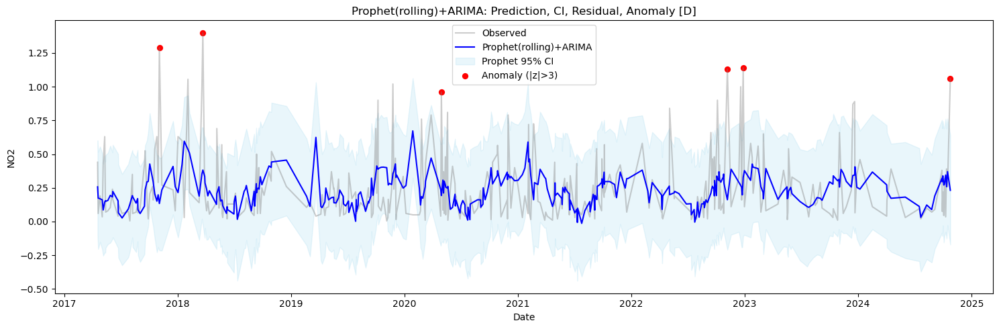

00:25:48 - cmdstanpy - INFO - Chain [1] start processing
00:25:48 - cmdstanpy - INFO - Chain [1] done processing
00:25:48 - cmdstanpy - INFO - Chain [1] start processing
00:25:48 - cmdstanpy - INFO - Chain [1] done processing
00:25:48 - cmdstanpy - INFO - Chain [1] start processing
00:25:48 - cmdstanpy - INFO - Chain [1] done processing
00:25:49 - cmdstanpy - INFO - Chain [1] start processing
00:25:49 - cmdstanpy - INFO - Chain [1] done processing
00:25:49 - cmdstanpy - INFO - Chain [1] start processing
00:25:49 - cmdstanpy - INFO - Chain [1] done processing
00:25:49 - cmdstanpy - INFO - Chain [1] start processing
00:25:49 - cmdstanpy - INFO - Chain [1] done processing
00:25:49 - cmdstanpy - INFO - Chain [1] start processing
00:25:49 - cmdstanpy - INFO - Chain [1] done processing
00:25:50 - cmdstanpy - INFO - Chain [1] start processing
00:25:50 - cmdstanpy - INFO - Chain [1] done processing
00:25:50 - cmdstanpy - INFO - Chain [1] start processing
00:25:50 - cmdstanpy - INFO - Chain [1]

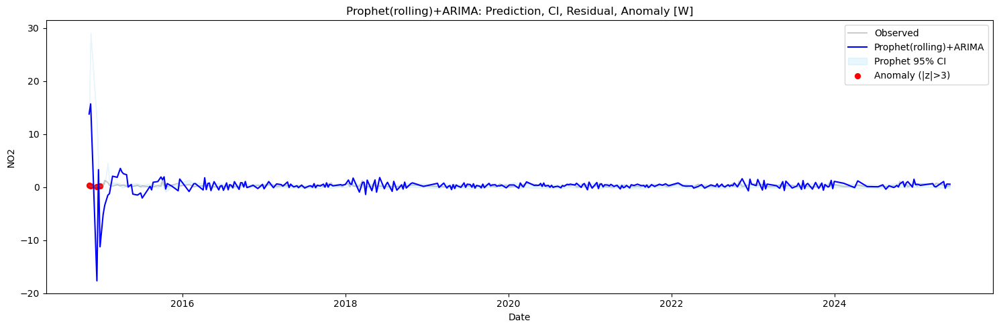

00:26:13 - cmdstanpy - INFO - Chain [1] start processing
00:26:13 - cmdstanpy - INFO - Chain [1] done processing
00:26:13 - cmdstanpy - INFO - Chain [1] start processing
00:26:13 - cmdstanpy - INFO - Chain [1] done processing
00:26:13 - cmdstanpy - INFO - Chain [1] start processing
00:26:19 - cmdstanpy - INFO - Chain [1] done processing
00:26:19 - cmdstanpy - INFO - Chain [1] start processing
00:26:24 - cmdstanpy - INFO - Chain [1] done processing
00:26:24 - cmdstanpy - INFO - Chain [1] start processing
00:26:25 - cmdstanpy - INFO - Chain [1] done processing
00:26:25 - cmdstanpy - INFO - Chain [1] start processing
00:26:25 - cmdstanpy - INFO - Chain [1] done processing
00:26:25 - cmdstanpy - INFO - Chain [1] start processing
00:26:25 - cmdstanpy - INFO - Chain [1] done processing
00:26:25 - cmdstanpy - INFO - Chain [1] start processing
00:26:28 - cmdstanpy - INFO - Chain [1] done processing
00:26:28 - cmdstanpy - INFO - Chain [1] start processing
00:26:28 - cmdstanpy - INFO - Chain [1]

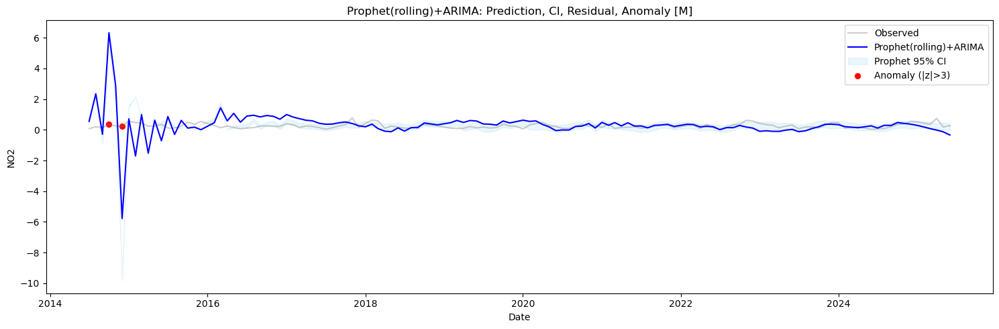

In [26]:
df_fcg_daily_result_nasa = rolling_prophet_forecast_CI_with_arima(
    make_agg(df_fcg_NASA, freq='D',pollutant='NO2'), pollutant='NO2',
    train_steps=140, test_steps=30, step=30, z_thresh=3, freq='D', plot=True
)
df_fcg_weekly_result_nasa = rolling_prophet_forecast_CI_with_arima(
    make_agg(df_fcg_NASA, freq='W',pollutant='NO2'), pollutant='NO2',
    train_steps=26, test_steps=8, step=4, z_thresh=3, freq='W', plot=True
)
df_fcg_monthly_result_nasa = rolling_prophet_forecast_CI_with_arima(
    make_agg(df_fcg_NASA, freq='M',pollutant='NO2'), pollutant='NO2',
    train_steps=5, test_steps=4, step=1, z_thresh=3, freq='M', plot=True
)

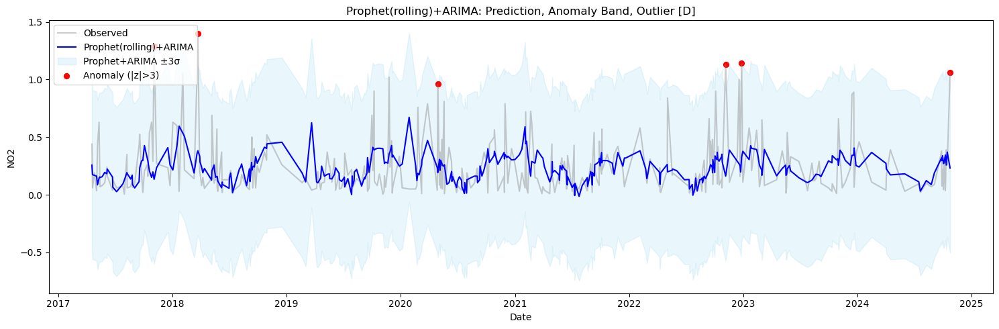

In [27]:
plot_arima_anomaly_band(df_fcg_daily_result_nasa, pollutant='NO2', shading_k=3, z_thresh=3, freq='D')


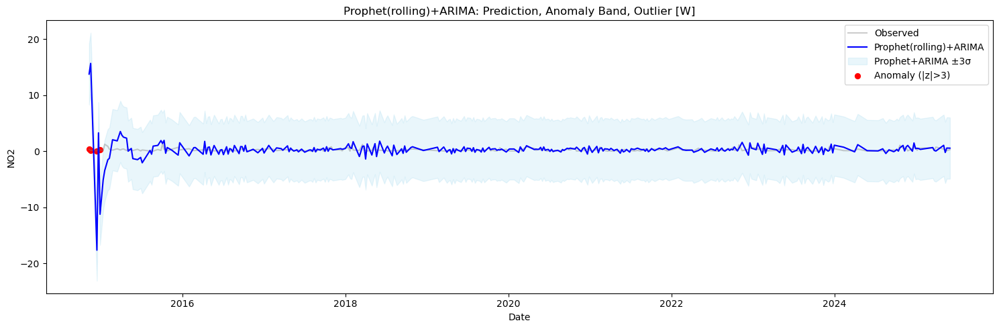

In [28]:
plot_arima_anomaly_band(df_fcg_weekly_result_nasa, pollutant='NO2', shading_k=3, z_thresh=3, freq='W')

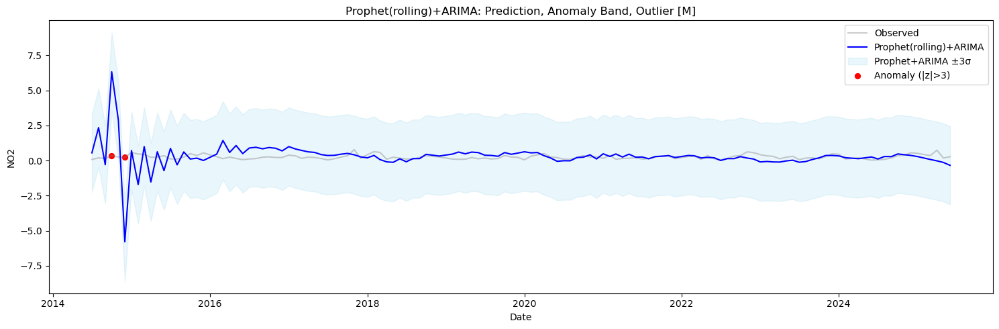

In [29]:
plot_arima_anomaly_band(df_fcg_monthly_result_nasa, pollutant='NO2', shading_k=3, z_thresh=3, freq='M')


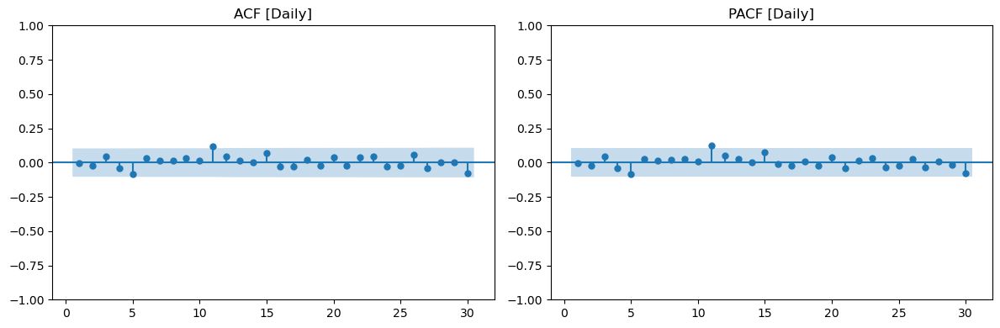

Ljung-Box Test [Daily] (using lags [10, 20, 30]):
      lb_stat  lb_pvalue
10   4.989362   0.891888
20  14.437515   0.807638
30  20.574712   0.900714



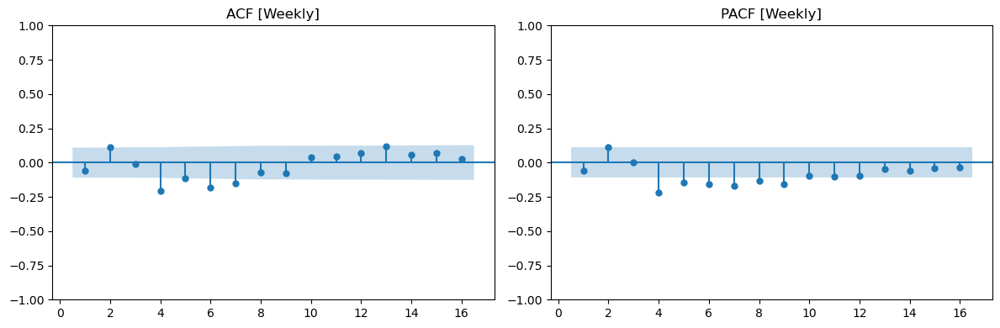

Ljung-Box Test [Weekly] (using lags [8, 12, 16]):
      lb_stat     lb_pvalue
8   43.085739  8.463669e-07
12  47.669790  3.567485e-06
16  55.149553  3.360426e-06



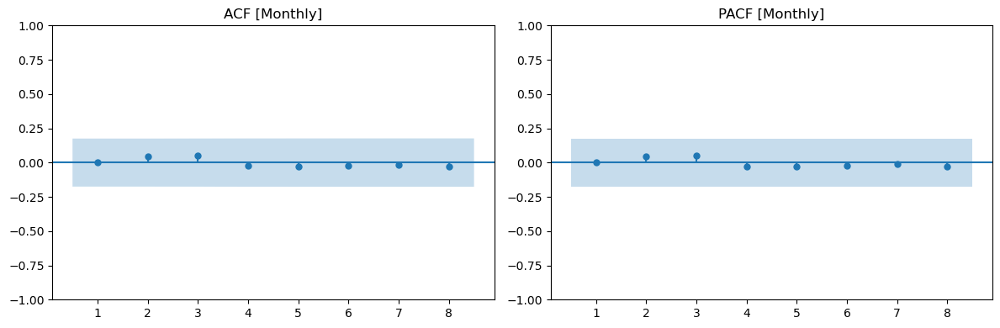

Ljung-Box Test [Monthly] (using lags [4, 8]):
    lb_stat  lb_pvalue
4  0.684623   0.953212
8  0.999252   0.998253



In [30]:
# Daily residual
residual_diagnostics(df_fcg_daily_result_nasa, lags=[10,20,30], title='[Daily]')
# Weekly residual
residual_diagnostics(df_fcg_weekly_result_nasa, lags=[8,12,16], title='[Weekly]')
# Monthly residual
residual_diagnostics(df_fcg_monthly_result_nasa, lags=[4,8], title='[Monthly]')

# Meizhou Port

In [32]:
df_mzu_NASA = pd.read_csv('data/Port_NO2/Meizhou_Port.csv')
df_mzu_NASA = cleaning_NASA_data(df_mzu_NASA,'NO2')

00:28:26 - cmdstanpy - INFO - Chain [1] start processing
00:28:26 - cmdstanpy - INFO - Chain [1] done processing
00:28:27 - cmdstanpy - INFO - Chain [1] start processing
00:28:27 - cmdstanpy - INFO - Chain [1] done processing
00:28:27 - cmdstanpy - INFO - Chain [1] start processing
00:28:27 - cmdstanpy - INFO - Chain [1] done processing
00:28:27 - cmdstanpy - INFO - Chain [1] start processing
00:28:27 - cmdstanpy - INFO - Chain [1] done processing
00:28:27 - cmdstanpy - INFO - Chain [1] start processing
00:28:27 - cmdstanpy - INFO - Chain [1] done processing
00:28:27 - cmdstanpy - INFO - Chain [1] start processing
00:28:27 - cmdstanpy - INFO - Chain [1] done processing
00:28:28 - cmdstanpy - INFO - Chain [1] start processing
00:28:28 - cmdstanpy - INFO - Chain [1] done processing
00:28:28 - cmdstanpy - INFO - Chain [1] start processing
00:28:28 - cmdstanpy - INFO - Chain [1] done processing
00:28:28 - cmdstanpy - INFO - Chain [1] start processing
00:28:28 - cmdstanpy - INFO - Chain [1]

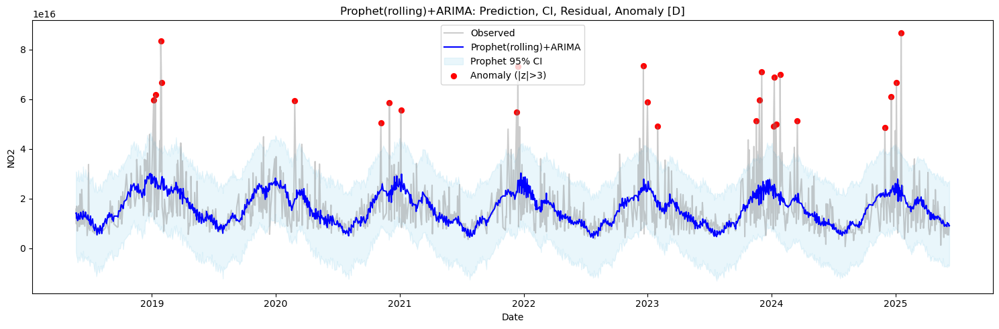

00:28:44 - cmdstanpy - INFO - Chain [1] start processing
00:28:44 - cmdstanpy - INFO - Chain [1] done processing
00:28:44 - cmdstanpy - INFO - Chain [1] start processing
00:28:44 - cmdstanpy - INFO - Chain [1] done processing
00:28:44 - cmdstanpy - INFO - Chain [1] start processing
00:28:44 - cmdstanpy - INFO - Chain [1] done processing
00:28:44 - cmdstanpy - INFO - Chain [1] start processing
00:28:44 - cmdstanpy - INFO - Chain [1] done processing
00:28:44 - cmdstanpy - INFO - Chain [1] start processing
00:28:44 - cmdstanpy - INFO - Chain [1] done processing
00:28:44 - cmdstanpy - INFO - Chain [1] start processing
00:28:45 - cmdstanpy - INFO - Chain [1] done processing
00:28:45 - cmdstanpy - INFO - Chain [1] start processing
00:28:45 - cmdstanpy - INFO - Chain [1] done processing
00:28:45 - cmdstanpy - INFO - Chain [1] start processing
00:28:45 - cmdstanpy - INFO - Chain [1] done processing
00:28:45 - cmdstanpy - INFO - Chain [1] start processing
00:28:45 - cmdstanpy - INFO - Chain [1]

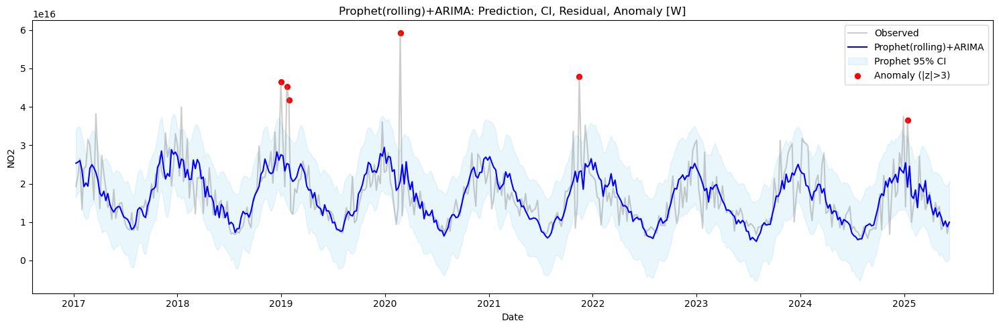

00:29:05 - cmdstanpy - INFO - Chain [1] start processing
00:29:06 - cmdstanpy - INFO - Chain [1] done processing
00:29:06 - cmdstanpy - INFO - Chain [1] start processing
00:29:06 - cmdstanpy - INFO - Chain [1] done processing
00:29:06 - cmdstanpy - INFO - Chain [1] start processing
00:29:06 - cmdstanpy - INFO - Chain [1] done processing
00:29:06 - cmdstanpy - INFO - Chain [1] start processing
00:29:07 - cmdstanpy - INFO - Chain [1] done processing
00:29:07 - cmdstanpy - INFO - Chain [1] start processing
00:29:07 - cmdstanpy - INFO - Chain [1] done processing
00:29:07 - cmdstanpy - INFO - Chain [1] start processing
00:29:07 - cmdstanpy - INFO - Chain [1] done processing
00:29:07 - cmdstanpy - INFO - Chain [1] start processing
00:29:08 - cmdstanpy - INFO - Chain [1] done processing
00:29:08 - cmdstanpy - INFO - Chain [1] start processing
00:29:08 - cmdstanpy - INFO - Chain [1] done processing
00:29:08 - cmdstanpy - INFO - Chain [1] start processing
00:29:08 - cmdstanpy - INFO - Chain [1]

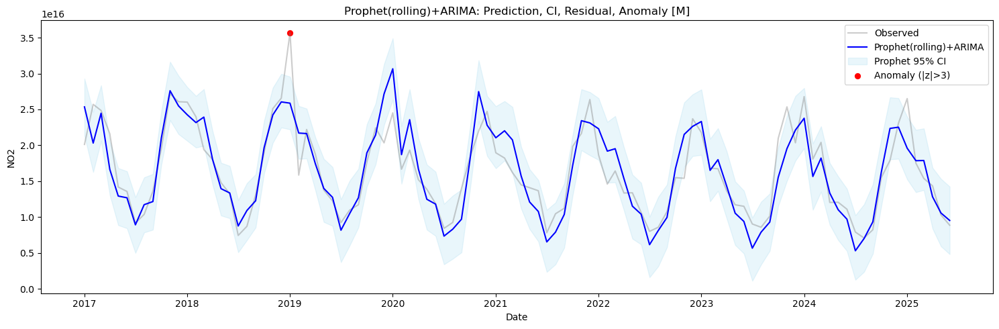

In [33]:
df_mzu_daily_result_nasa = rolling_prophet_forecast_CI_with_arima(
    make_agg(df_mzu_NASA, freq='D',pollutant='NO2'), pollutant='NO2',
    train_steps=730, test_steps=30, step=30, z_thresh=3, freq='D', plot=True
)
df_mzu_weekly_result_nasa = rolling_prophet_forecast_CI_with_arima(
    make_agg(df_mzu_NASA, freq='W',pollutant='NO2'), pollutant='NO2',
    train_steps=156, test_steps=8, step=4, z_thresh=3, freq='W', plot=True
)
df_mzu_monthly_result_nasa = rolling_prophet_forecast_CI_with_arima(
    make_agg(df_mzu_NASA, freq='M',pollutant='NO2'), pollutant='NO2',
    train_steps=36, test_steps=4, step=1, z_thresh=3, freq='M', plot=True
)

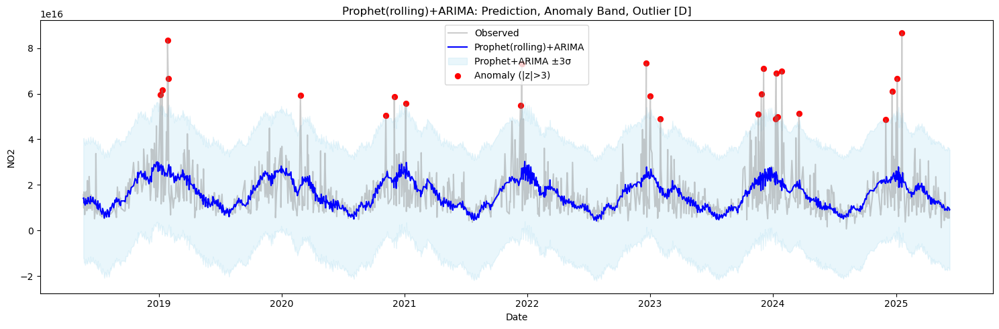

In [34]:
plot_arima_anomaly_band(df_mzu_daily_result_nasa, pollutant='NO2', shading_k=3, z_thresh=3, freq='D')


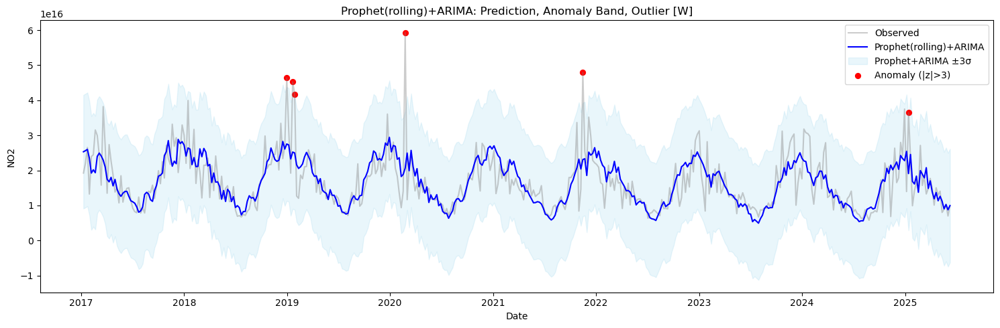

In [35]:
plot_arima_anomaly_band(df_mzu_weekly_result_nasa, pollutant='NO2', shading_k=3, z_thresh=3, freq='W')


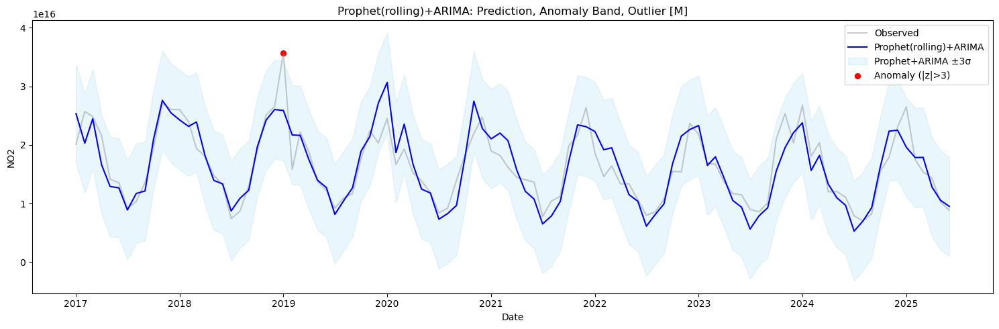

In [36]:
plot_arima_anomaly_band(df_mzu_monthly_result_nasa, pollutant='NO2', shading_k=3, z_thresh=3, freq='M')


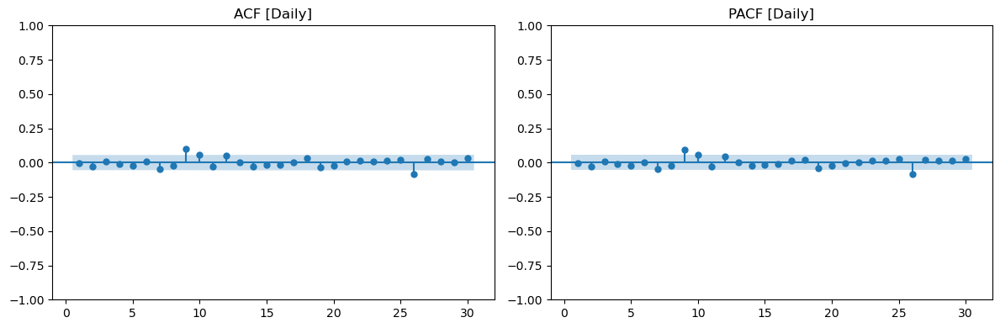

Ljung-Box Test [Daily] (using lags [10, 20, 30]):
      lb_stat  lb_pvalue
10  22.131487   0.014449
20  31.524232   0.048639
30  43.899836   0.048699



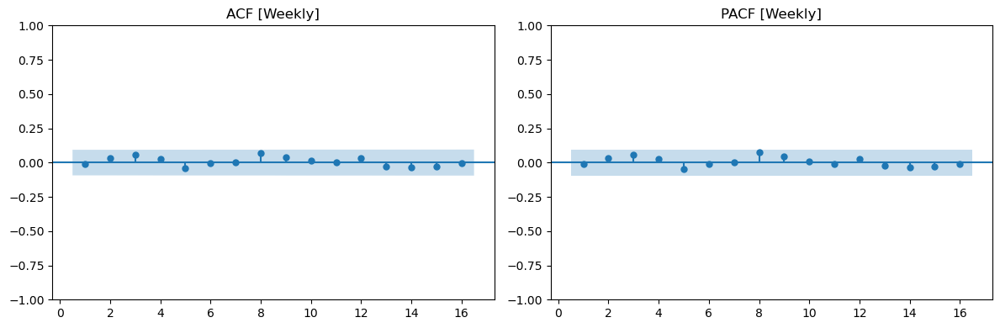

Ljung-Box Test [Weekly] (using lags [8, 12, 16]):
     lb_stat  lb_pvalue
8   5.232013   0.732515
12  6.493533   0.889192
16  7.717806   0.956827



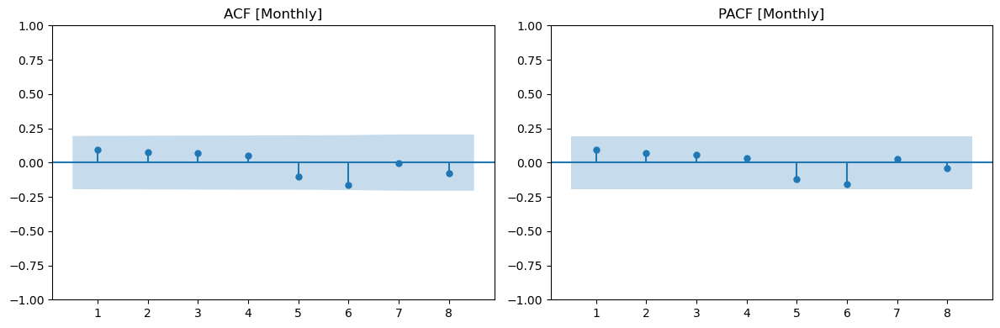

Ljung-Box Test [Monthly] (using lags [4, 8]):
    lb_stat  lb_pvalue
4  2.393998   0.663712
8  7.100770   0.525800



In [37]:
# Daily residual
residual_diagnostics(df_mzu_daily_result_nasa, lags=[10,20,30], title='[Daily]')
# Weekly residual
residual_diagnostics(df_mzu_weekly_result_nasa, lags=[8,12,16], title='[Weekly]')
# Monthly residual
residual_diagnostics(df_mzu_monthly_result_nasa, lags=[4,8], title='[Monthly]')

# Nanjing Port

In [38]:
df_njg_NASA = pd.read_csv('data/Port_NO2/Nanjing_Port.csv')
df_njg_NASA = cleaning_NASA_data(df_njg_NASA,'NO2')

00:29:37 - cmdstanpy - INFO - Chain [1] start processing
00:29:37 - cmdstanpy - INFO - Chain [1] done processing
00:29:37 - cmdstanpy - INFO - Chain [1] start processing
00:29:37 - cmdstanpy - INFO - Chain [1] done processing
00:29:37 - cmdstanpy - INFO - Chain [1] start processing
00:29:37 - cmdstanpy - INFO - Chain [1] done processing
00:29:37 - cmdstanpy - INFO - Chain [1] start processing
00:29:37 - cmdstanpy - INFO - Chain [1] done processing
00:29:37 - cmdstanpy - INFO - Chain [1] start processing
00:29:38 - cmdstanpy - INFO - Chain [1] done processing
00:29:38 - cmdstanpy - INFO - Chain [1] start processing
00:29:38 - cmdstanpy - INFO - Chain [1] done processing
00:29:38 - cmdstanpy - INFO - Chain [1] start processing
00:29:38 - cmdstanpy - INFO - Chain [1] done processing
00:29:38 - cmdstanpy - INFO - Chain [1] start processing
00:29:38 - cmdstanpy - INFO - Chain [1] done processing
00:29:38 - cmdstanpy - INFO - Chain [1] start processing
00:29:39 - cmdstanpy - INFO - Chain [1]

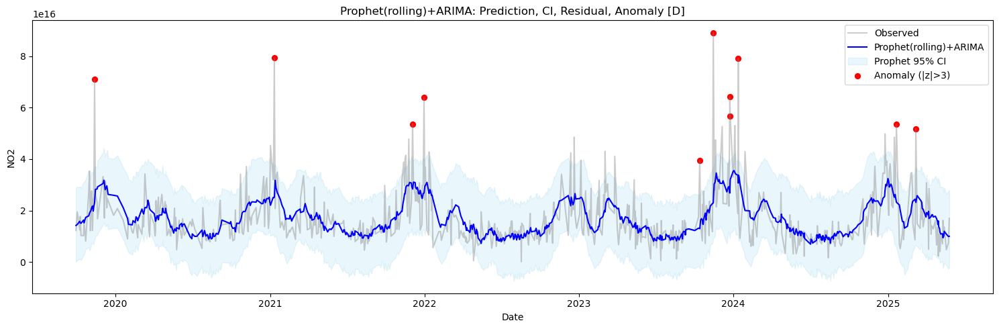

00:29:44 - cmdstanpy - INFO - Chain [1] start processing
00:29:44 - cmdstanpy - INFO - Chain [1] done processing
00:29:44 - cmdstanpy - INFO - Chain [1] start processing
00:29:44 - cmdstanpy - INFO - Chain [1] done processing
00:29:44 - cmdstanpy - INFO - Chain [1] start processing
00:29:44 - cmdstanpy - INFO - Chain [1] done processing
00:29:45 - cmdstanpy - INFO - Chain [1] start processing
00:29:45 - cmdstanpy - INFO - Chain [1] done processing
00:29:45 - cmdstanpy - INFO - Chain [1] start processing
00:29:45 - cmdstanpy - INFO - Chain [1] done processing
00:29:45 - cmdstanpy - INFO - Chain [1] start processing
00:29:45 - cmdstanpy - INFO - Chain [1] done processing
00:29:45 - cmdstanpy - INFO - Chain [1] start processing
00:29:45 - cmdstanpy - INFO - Chain [1] done processing
00:29:45 - cmdstanpy - INFO - Chain [1] start processing
00:29:45 - cmdstanpy - INFO - Chain [1] done processing
00:29:45 - cmdstanpy - INFO - Chain [1] start processing
00:29:45 - cmdstanpy - INFO - Chain [1]

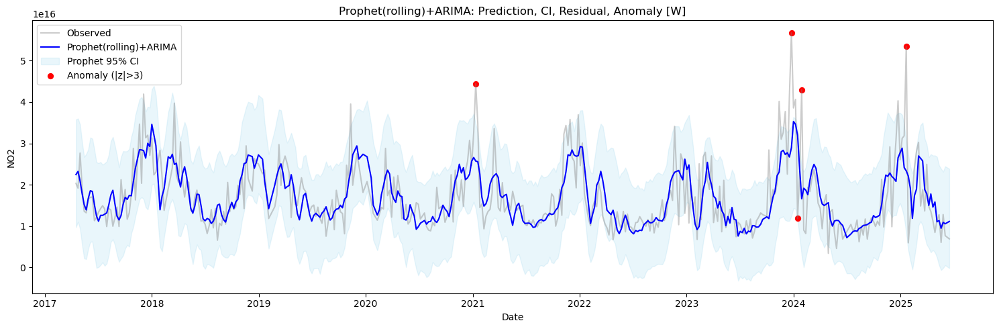

00:30:04 - cmdstanpy - INFO - Chain [1] start processing
00:30:04 - cmdstanpy - INFO - Chain [1] done processing
00:30:04 - cmdstanpy - INFO - Chain [1] start processing
00:30:04 - cmdstanpy - INFO - Chain [1] done processing
00:30:04 - cmdstanpy - INFO - Chain [1] start processing
00:30:04 - cmdstanpy - INFO - Chain [1] done processing
00:30:05 - cmdstanpy - INFO - Chain [1] start processing
00:30:05 - cmdstanpy - INFO - Chain [1] done processing
00:30:05 - cmdstanpy - INFO - Chain [1] start processing
00:30:05 - cmdstanpy - INFO - Chain [1] done processing
00:30:05 - cmdstanpy - INFO - Chain [1] start processing
00:30:05 - cmdstanpy - INFO - Chain [1] done processing
00:30:05 - cmdstanpy - INFO - Chain [1] start processing
00:30:06 - cmdstanpy - INFO - Chain [1] done processing
00:30:06 - cmdstanpy - INFO - Chain [1] start processing
00:30:06 - cmdstanpy - INFO - Chain [1] done processing
00:30:06 - cmdstanpy - INFO - Chain [1] start processing
00:30:06 - cmdstanpy - INFO - Chain [1]

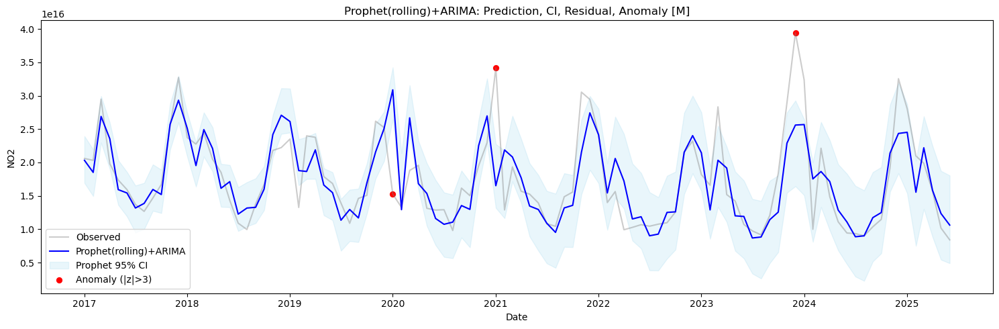

In [39]:
df_njg_daily_result_nasa = rolling_prophet_forecast_CI_with_arima(
    make_agg(df_njg_NASA, freq='D',pollutant='NO2'), pollutant='NO2',
    train_steps=730, test_steps=30, step=30, z_thresh=3, freq='D', plot=True
)
df_njg_weekly_result_nasa = rolling_prophet_forecast_CI_with_arima(
    make_agg(df_njg_NASA, freq='W',pollutant='NO2'), pollutant='NO2',
    train_steps=156, test_steps=8, step=4, z_thresh=3, freq='W', plot=True
)
df_njg_monthly_result_nasa = rolling_prophet_forecast_CI_with_arima(
    make_agg(df_njg_NASA, freq='M',pollutant='NO2'), pollutant='NO2',
    train_steps=36, test_steps=4, step=1, z_thresh=3, freq='M', plot=True
)

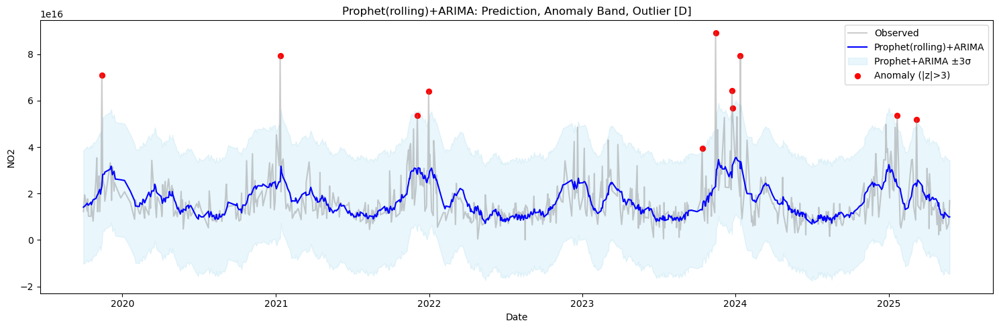

In [40]:
plot_arima_anomaly_band(df_njg_daily_result_nasa, pollutant='NO2', shading_k=3, z_thresh=3, freq='D')


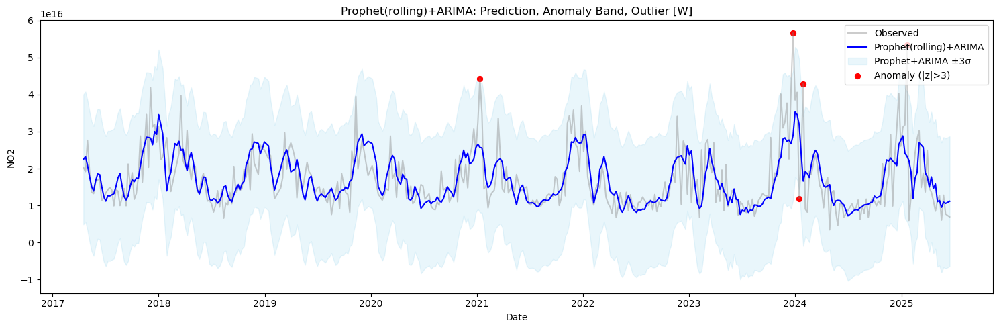

In [41]:
plot_arima_anomaly_band(df_njg_weekly_result_nasa, pollutant='NO2', shading_k=3, z_thresh=3, freq='W')


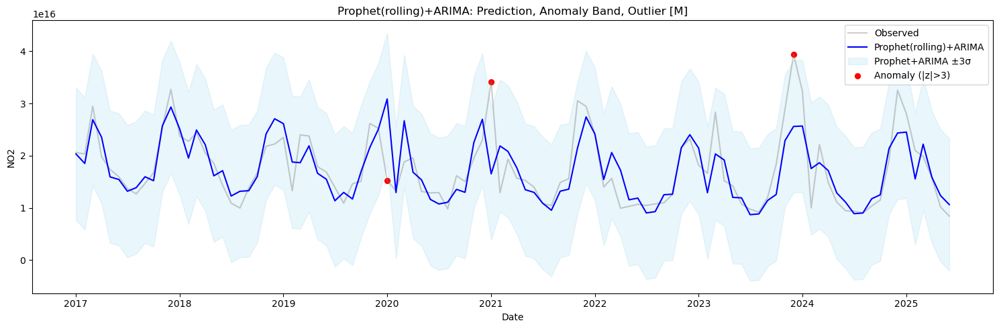

In [42]:
plot_arima_anomaly_band(df_njg_monthly_result_nasa, pollutant='NO2', shading_k=3, z_thresh=3, freq='M')


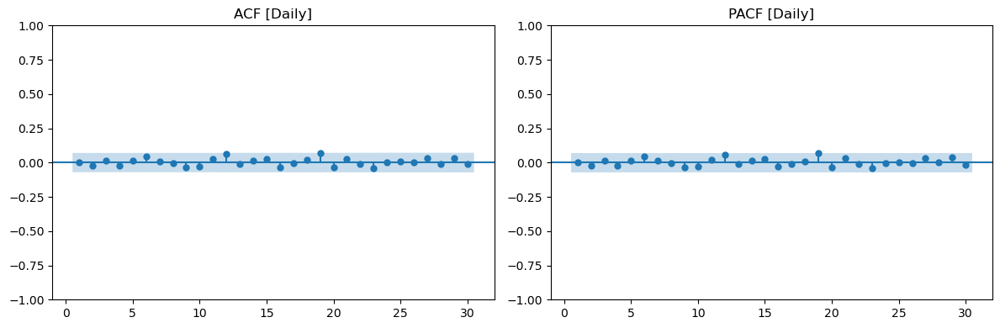

Ljung-Box Test [Daily] (using lags [10, 20, 30]):
      lb_stat  lb_pvalue
10   4.266300   0.934535
20  14.275910   0.816236
30  18.327007   0.952995



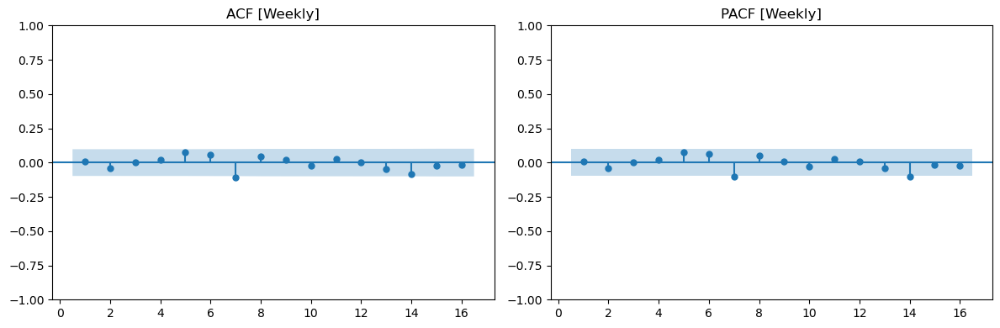

Ljung-Box Test [Weekly] (using lags [8, 12, 16]):
      lb_stat  lb_pvalue
8   10.376453   0.239591
12  11.167102   0.514655
16  15.237244   0.507336



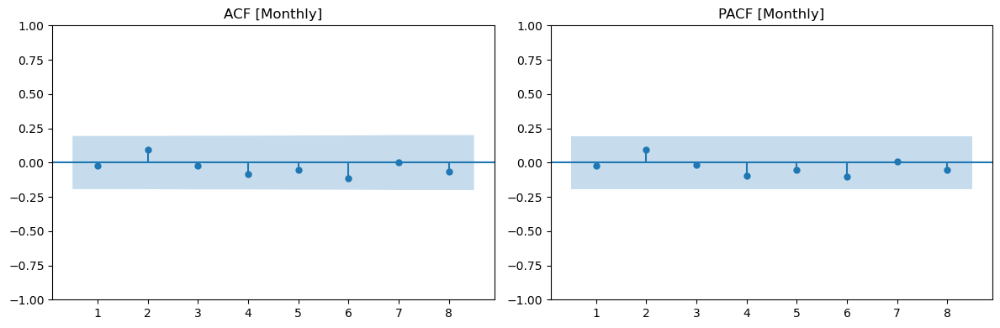

Ljung-Box Test [Monthly] (using lags [4, 8]):
    lb_stat  lb_pvalue
4  1.877100   0.758350
8  4.124893   0.845683



In [43]:
# Daily residual
residual_diagnostics(df_njg_daily_result_nasa, lags=[10,20,30], title='[Daily]')
# Weekly residual
residual_diagnostics(df_njg_weekly_result_nasa, lags=[8,12,16], title='[Weekly]')
# Monthly residual
residual_diagnostics(df_njg_monthly_result_nasa, lags=[4,8], title='[Monthly]')

# Ningbo Port

In [44]:
df_ngo_NASA = pd.read_csv('data/Port_NO2/Ningbo_Port.csv')
df_ngo_NASA = cleaning_NASA_data(df_ngo_NASA,'NO2')

00:30:33 - cmdstanpy - INFO - Chain [1] start processing
00:30:33 - cmdstanpy - INFO - Chain [1] done processing
00:30:33 - cmdstanpy - INFO - Chain [1] start processing
00:30:34 - cmdstanpy - INFO - Chain [1] done processing
00:30:34 - cmdstanpy - INFO - Chain [1] start processing
00:30:34 - cmdstanpy - INFO - Chain [1] done processing
00:30:34 - cmdstanpy - INFO - Chain [1] start processing
00:30:34 - cmdstanpy - INFO - Chain [1] done processing
00:30:34 - cmdstanpy - INFO - Chain [1] start processing
00:30:34 - cmdstanpy - INFO - Chain [1] done processing
00:30:34 - cmdstanpy - INFO - Chain [1] start processing
00:30:34 - cmdstanpy - INFO - Chain [1] done processing
00:30:35 - cmdstanpy - INFO - Chain [1] start processing
00:30:35 - cmdstanpy - INFO - Chain [1] done processing
00:30:35 - cmdstanpy - INFO - Chain [1] start processing
00:30:35 - cmdstanpy - INFO - Chain [1] done processing
00:30:35 - cmdstanpy - INFO - Chain [1] start processing
00:30:35 - cmdstanpy - INFO - Chain [1]

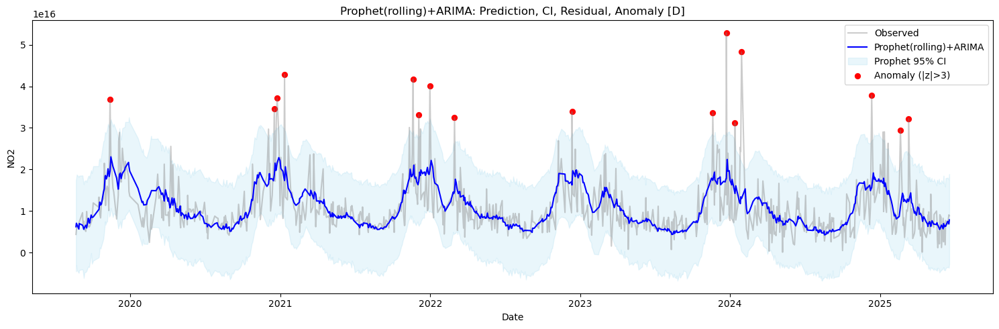

00:30:41 - cmdstanpy - INFO - Chain [1] start processing
00:30:41 - cmdstanpy - INFO - Chain [1] done processing
00:30:41 - cmdstanpy - INFO - Chain [1] start processing
00:30:41 - cmdstanpy - INFO - Chain [1] done processing
00:30:41 - cmdstanpy - INFO - Chain [1] start processing
00:30:41 - cmdstanpy - INFO - Chain [1] done processing
00:30:41 - cmdstanpy - INFO - Chain [1] start processing
00:30:41 - cmdstanpy - INFO - Chain [1] done processing
00:30:41 - cmdstanpy - INFO - Chain [1] start processing
00:30:42 - cmdstanpy - INFO - Chain [1] done processing
00:30:42 - cmdstanpy - INFO - Chain [1] start processing
00:30:42 - cmdstanpy - INFO - Chain [1] done processing
00:30:42 - cmdstanpy - INFO - Chain [1] start processing
00:30:42 - cmdstanpy - INFO - Chain [1] done processing
00:30:42 - cmdstanpy - INFO - Chain [1] start processing
00:30:42 - cmdstanpy - INFO - Chain [1] done processing
00:30:42 - cmdstanpy - INFO - Chain [1] start processing
00:30:42 - cmdstanpy - INFO - Chain [1]

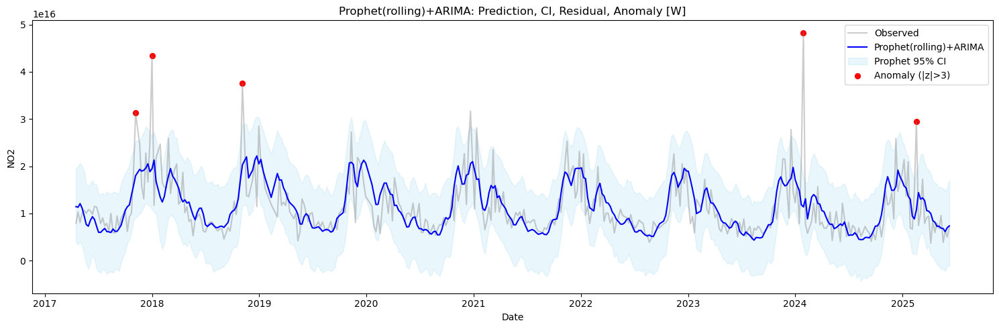

00:31:01 - cmdstanpy - INFO - Chain [1] start processing
00:31:01 - cmdstanpy - INFO - Chain [1] done processing
00:31:01 - cmdstanpy - INFO - Chain [1] start processing
00:31:01 - cmdstanpy - INFO - Chain [1] done processing
00:31:01 - cmdstanpy - INFO - Chain [1] start processing
00:31:01 - cmdstanpy - INFO - Chain [1] done processing
00:31:01 - cmdstanpy - INFO - Chain [1] start processing
00:31:02 - cmdstanpy - INFO - Chain [1] done processing
00:31:02 - cmdstanpy - INFO - Chain [1] start processing
00:31:02 - cmdstanpy - INFO - Chain [1] done processing
00:31:02 - cmdstanpy - INFO - Chain [1] start processing
00:31:02 - cmdstanpy - INFO - Chain [1] done processing
00:31:02 - cmdstanpy - INFO - Chain [1] start processing
00:31:02 - cmdstanpy - INFO - Chain [1] done processing
00:31:03 - cmdstanpy - INFO - Chain [1] start processing
00:31:03 - cmdstanpy - INFO - Chain [1] done processing
00:31:03 - cmdstanpy - INFO - Chain [1] start processing
00:31:03 - cmdstanpy - INFO - Chain [1]

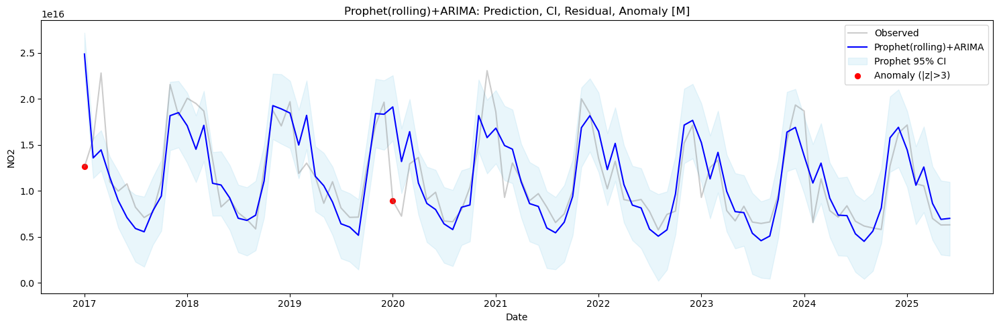

In [45]:
df_ngo_daily_result_nasa = rolling_prophet_forecast_CI_with_arima(
    make_agg(df_ngo_NASA, freq='D',pollutant='NO2'), pollutant='NO2',
    train_steps=730, test_steps=30, step=30, z_thresh=3, freq='D', plot=True
)
df_ngo_weekly_result_nasa = rolling_prophet_forecast_CI_with_arima(
    make_agg(df_ngo_NASA, freq='W',pollutant='NO2'), pollutant='NO2',
    train_steps=156, test_steps=8, step=4, z_thresh=3, freq='W', plot=True
)
df_ngo_monthly_result_nasa = rolling_prophet_forecast_CI_with_arima(
    make_agg(df_ngo_NASA, freq='M',pollutant='NO2'), pollutant='NO2',
    train_steps=36, test_steps=4, step=1, z_thresh=3, freq='M', plot=True
)

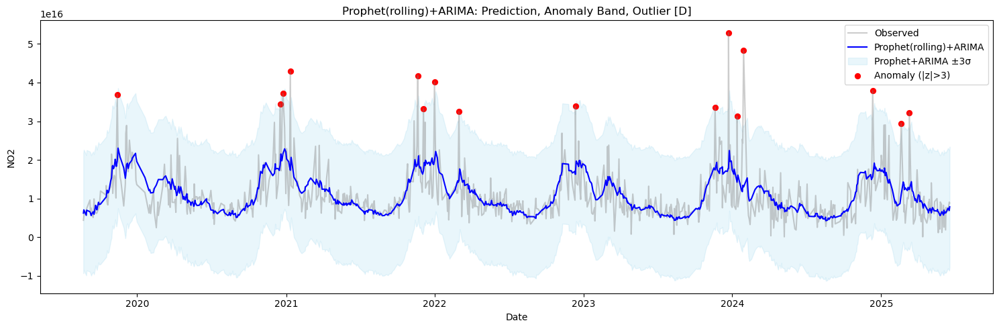

In [46]:
plot_arima_anomaly_band(df_ngo_daily_result_nasa, pollutant='NO2', shading_k=3, z_thresh=3, freq='D')


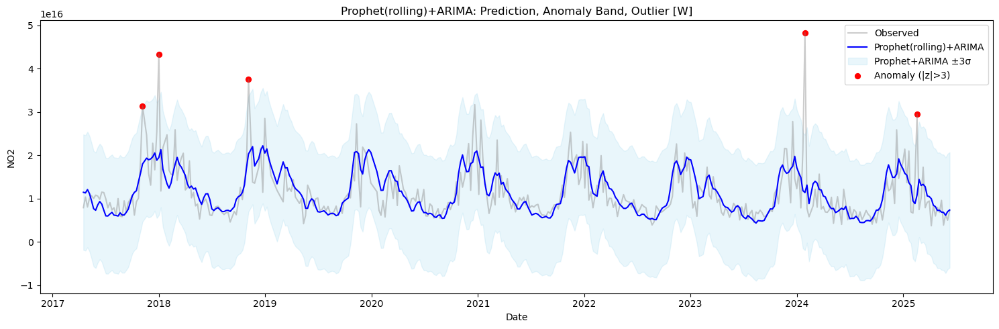

In [47]:
plot_arima_anomaly_band(df_ngo_weekly_result_nasa, pollutant='NO2', shading_k=3, z_thresh=3, freq='W')


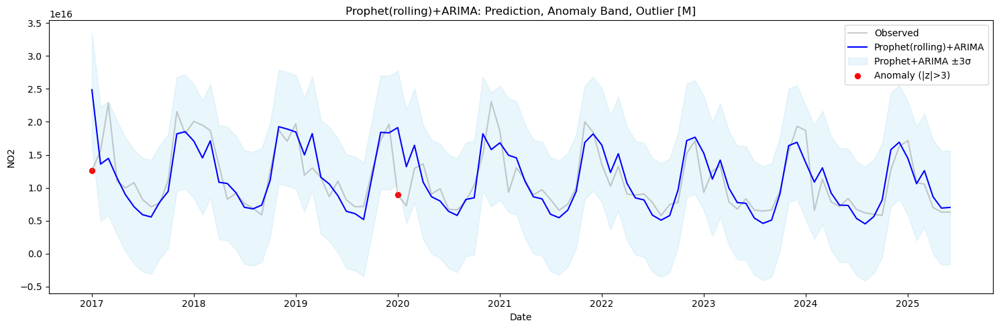

In [48]:
plot_arima_anomaly_band(df_ngo_monthly_result_nasa, pollutant='NO2', shading_k=3, z_thresh=3, freq='M')


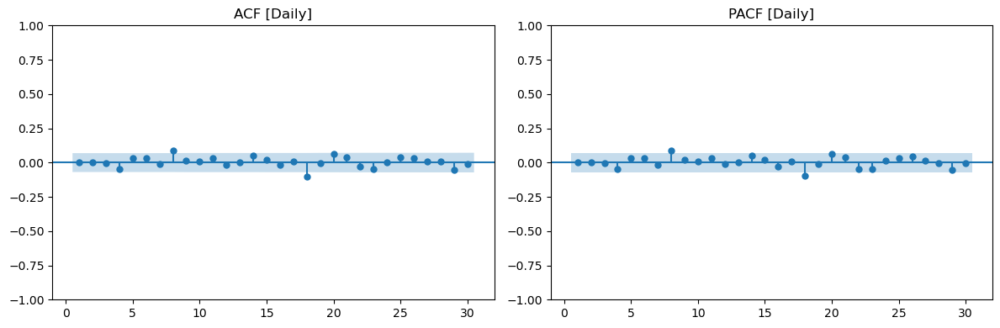

Ljung-Box Test [Daily] (using lags [10, 20, 30]):
      lb_stat  lb_pvalue
10  10.161882   0.426408
20  26.203313   0.159202
30  34.253636   0.270806



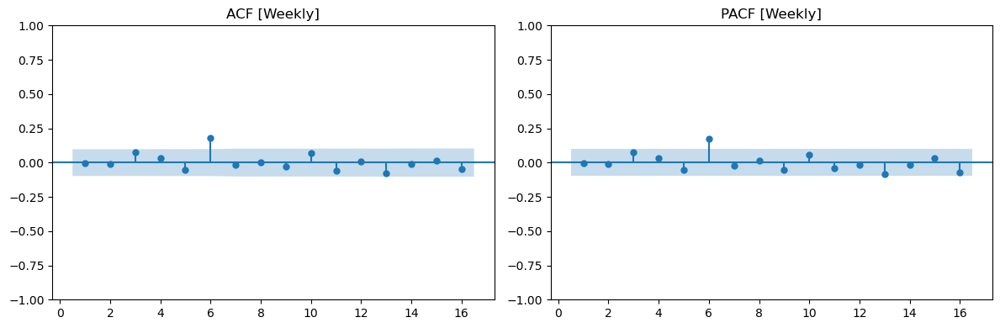

Ljung-Box Test [Weekly] (using lags [8, 12, 16]):
      lb_stat  lb_pvalue
8   17.269154   0.027425
12  20.758044   0.054038
16  24.382917   0.081468



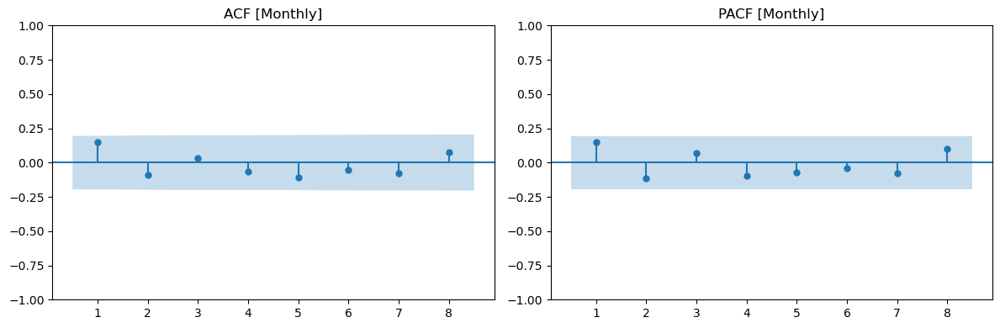

Ljung-Box Test [Monthly] (using lags [4, 8]):
    lb_stat  lb_pvalue
4  3.842905   0.427684
8  6.773862   0.561216



In [49]:
# Daily residual
residual_diagnostics(df_ngo_daily_result_nasa, lags=[10,20,30], title='[Daily]')
# Weekly residual
residual_diagnostics(df_ngo_weekly_result_nasa, lags=[8,12,16], title='[Weekly]')
# Monthly residual
residual_diagnostics(df_ngo_monthly_result_nasa, lags=[4,8], title='[Monthly]')

# Qinzhou Port

In [50]:
df_qzu_NASA = pd.read_csv('data/Port_NO2/Qinzhou_Port.csv')
df_qzu_NASA = cleaning_NASA_data(df_qzu_NASA,'NO2')

00:31:51 - cmdstanpy - INFO - Chain [1] start processing
00:31:51 - cmdstanpy - INFO - Chain [1] done processing
00:31:51 - cmdstanpy - INFO - Chain [1] start processing
00:31:51 - cmdstanpy - INFO - Chain [1] done processing
00:31:51 - cmdstanpy - INFO - Chain [1] start processing
00:31:51 - cmdstanpy - INFO - Chain [1] done processing
00:31:51 - cmdstanpy - INFO - Chain [1] start processing
00:31:52 - cmdstanpy - INFO - Chain [1] done processing
00:31:52 - cmdstanpy - INFO - Chain [1] start processing
00:31:52 - cmdstanpy - INFO - Chain [1] done processing
00:31:52 - cmdstanpy - INFO - Chain [1] start processing
00:31:52 - cmdstanpy - INFO - Chain [1] done processing
00:31:52 - cmdstanpy - INFO - Chain [1] start processing
00:31:52 - cmdstanpy - INFO - Chain [1] done processing
00:31:52 - cmdstanpy - INFO - Chain [1] start processing
00:31:52 - cmdstanpy - INFO - Chain [1] done processing
00:31:53 - cmdstanpy - INFO - Chain [1] start processing
00:31:53 - cmdstanpy - INFO - Chain [1]

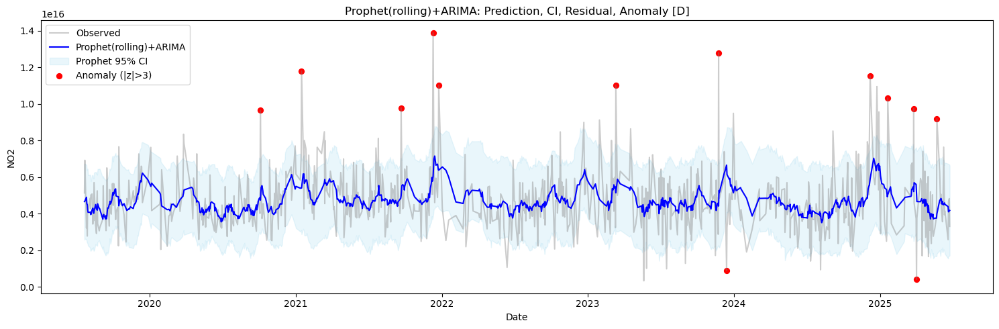

00:31:59 - cmdstanpy - INFO - Chain [1] start processing
00:31:59 - cmdstanpy - INFO - Chain [1] done processing
00:31:59 - cmdstanpy - INFO - Chain [1] start processing
00:31:59 - cmdstanpy - INFO - Chain [1] done processing
00:31:59 - cmdstanpy - INFO - Chain [1] start processing
00:31:59 - cmdstanpy - INFO - Chain [1] done processing
00:31:59 - cmdstanpy - INFO - Chain [1] start processing
00:32:00 - cmdstanpy - INFO - Chain [1] done processing
00:32:00 - cmdstanpy - INFO - Chain [1] start processing
00:32:00 - cmdstanpy - INFO - Chain [1] done processing
00:32:00 - cmdstanpy - INFO - Chain [1] start processing
00:32:00 - cmdstanpy - INFO - Chain [1] done processing
00:32:00 - cmdstanpy - INFO - Chain [1] start processing
00:32:00 - cmdstanpy - INFO - Chain [1] done processing
00:32:00 - cmdstanpy - INFO - Chain [1] start processing
00:32:00 - cmdstanpy - INFO - Chain [1] done processing
00:32:00 - cmdstanpy - INFO - Chain [1] start processing
00:32:00 - cmdstanpy - INFO - Chain [1]

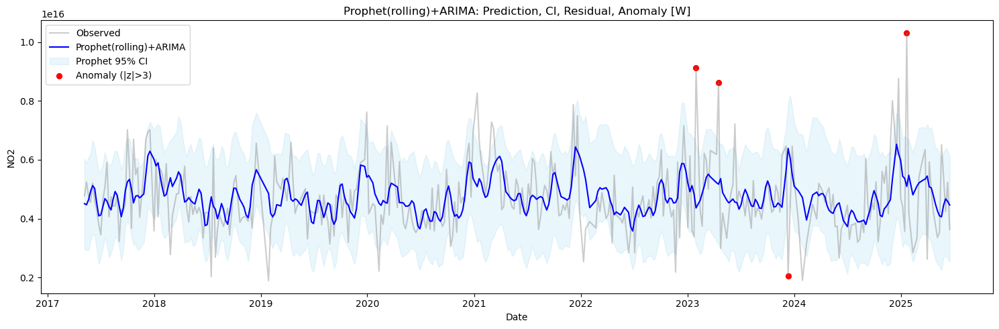

00:32:16 - cmdstanpy - INFO - Chain [1] start processing
00:32:16 - cmdstanpy - INFO - Chain [1] done processing
00:32:17 - cmdstanpy - INFO - Chain [1] start processing
00:32:17 - cmdstanpy - INFO - Chain [1] done processing
00:32:17 - cmdstanpy - INFO - Chain [1] start processing
00:32:17 - cmdstanpy - INFO - Chain [1] done processing
00:32:17 - cmdstanpy - INFO - Chain [1] start processing
00:32:17 - cmdstanpy - INFO - Chain [1] done processing
00:32:17 - cmdstanpy - INFO - Chain [1] start processing
00:32:18 - cmdstanpy - INFO - Chain [1] done processing
00:32:18 - cmdstanpy - INFO - Chain [1] start processing
00:32:18 - cmdstanpy - INFO - Chain [1] done processing
00:32:18 - cmdstanpy - INFO - Chain [1] start processing
00:32:18 - cmdstanpy - INFO - Chain [1] done processing
00:32:18 - cmdstanpy - INFO - Chain [1] start processing
00:32:19 - cmdstanpy - INFO - Chain [1] done processing
00:32:19 - cmdstanpy - INFO - Chain [1] start processing
00:32:19 - cmdstanpy - INFO - Chain [1]

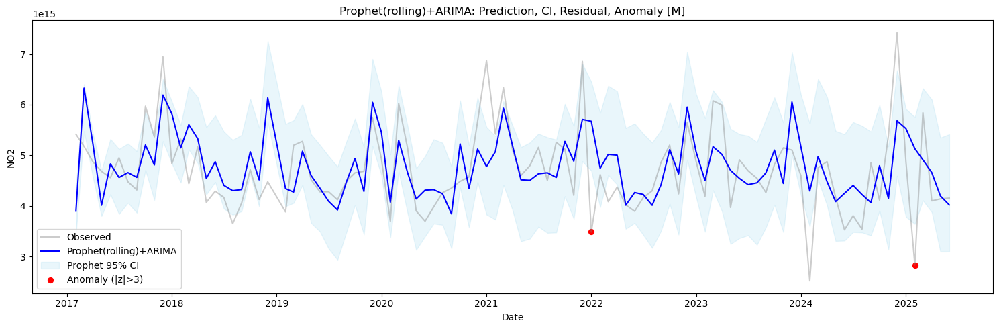

In [51]:
df_qzu_daily_result_nasa = rolling_prophet_forecast_CI_with_arima(
    make_agg(df_qzu_NASA, freq='D',pollutant='NO2'), pollutant='NO2',
    train_steps=730, test_steps=30, step=30, z_thresh=3, freq='D', plot=True
)
df_qzu_weekly_result_nasa = rolling_prophet_forecast_CI_with_arima(
    make_agg(df_qzu_NASA, freq='W',pollutant='NO2'), pollutant='NO2',
    train_steps=156, test_steps=8, step=4, z_thresh=3, freq='W', plot=True
)
df_qzu_monthly_result_nasa = rolling_prophet_forecast_CI_with_arima(
    make_agg(df_qzu_NASA, freq='M',pollutant='NO2'), pollutant='NO2',
    train_steps=36, test_steps=4, step=1, z_thresh=3, freq='M', plot=True
)

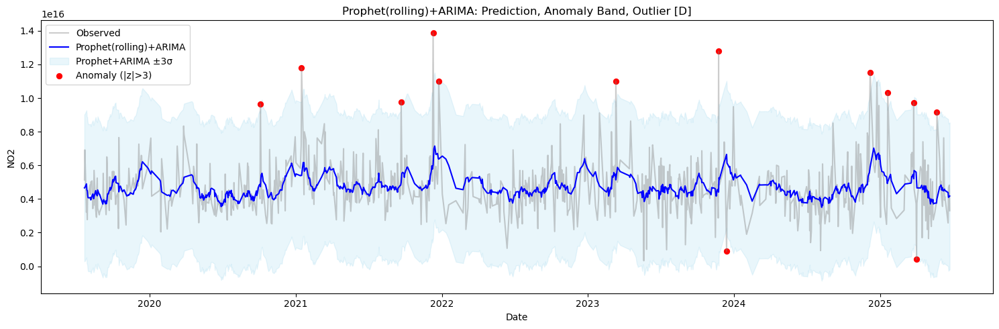

In [52]:
plot_arima_anomaly_band(df_qzu_daily_result_nasa, pollutant='NO2', shading_k=3, z_thresh=3, freq='D')


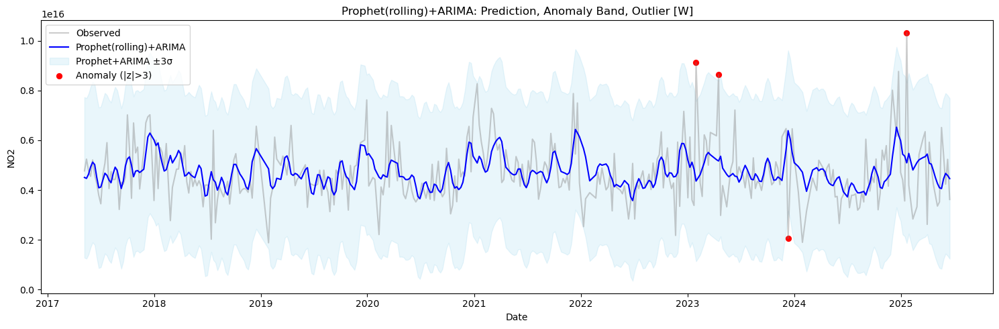

In [53]:
plot_arima_anomaly_band(df_qzu_weekly_result_nasa, pollutant='NO2', shading_k=3, z_thresh=3, freq='W')


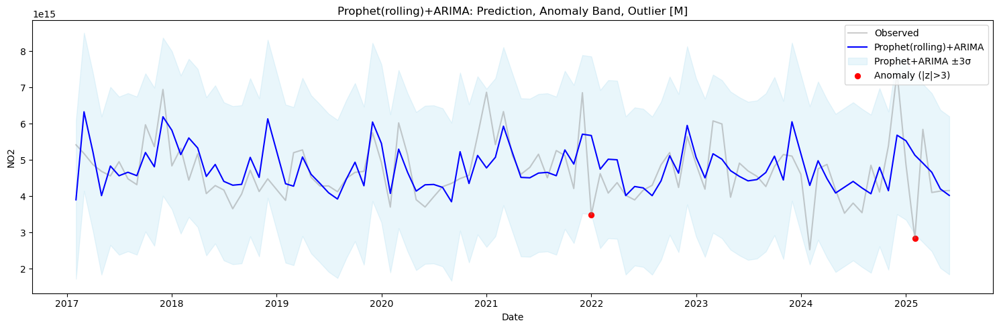

In [54]:
plot_arima_anomaly_band(df_qzu_monthly_result_nasa, pollutant='NO2', shading_k=3, z_thresh=3, freq='M')


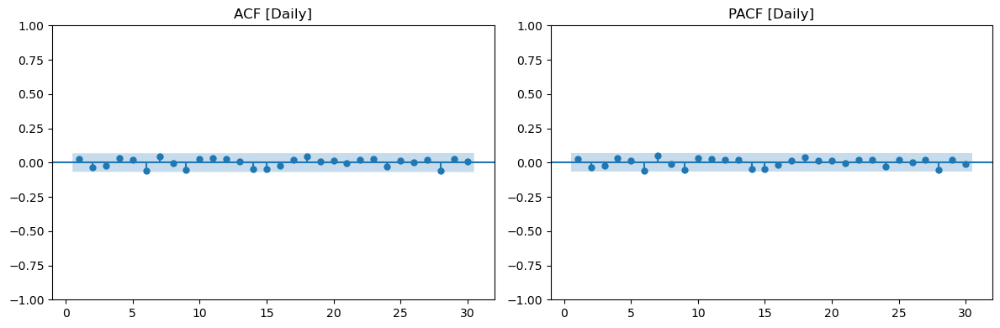

Ljung-Box Test [Daily] (using lags [10, 20, 30]):
      lb_stat  lb_pvalue
10  10.692740   0.381952
20  18.011486   0.586652
30  23.438891   0.796796



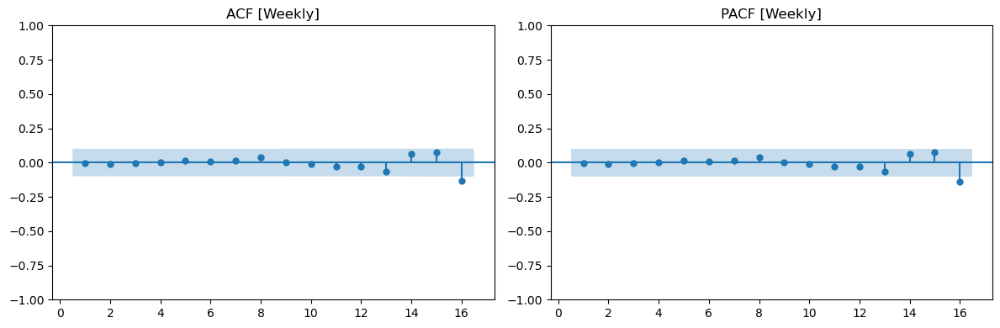

Ljung-Box Test [Weekly] (using lags [8, 12, 16]):
      lb_stat  lb_pvalue
8    0.877692   0.998909
12   1.613505   0.999807
16  14.534434   0.558964



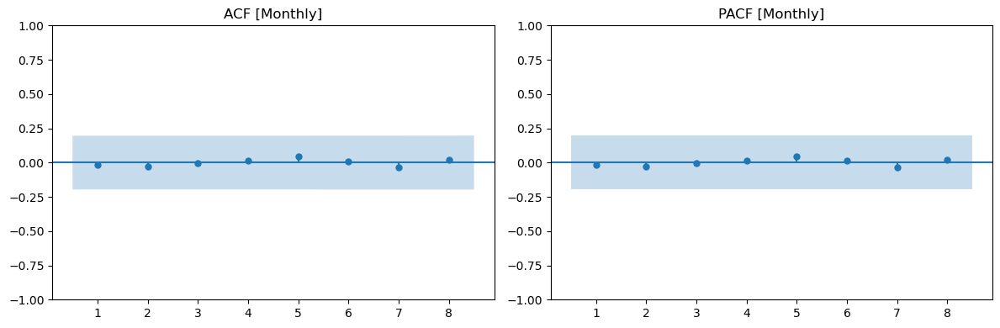

Ljung-Box Test [Monthly] (using lags [4, 8]):
    lb_stat  lb_pvalue
4  0.125023   0.998126
8  0.582540   0.999762



In [55]:
# Daily residual
residual_diagnostics(df_qzu_daily_result_nasa, lags=[10,20,30], title='[Daily]')
# Weekly residual
residual_diagnostics(df_qzu_weekly_result_nasa, lags=[8,12,16], title='[Weekly]')
# Monthly residual
residual_diagnostics(df_qzu_monthly_result_nasa, lags=[4,8], title='[Monthly]')

# Shanghai Port

In [56]:
df_shi_NASA = pd.read_csv('data/Port_NO2/Shanghai_Port.csv')
df_shi_NASA = cleaning_NASA_data(df_shi_NASA,'NO2')

00:32:47 - cmdstanpy - INFO - Chain [1] start processing
00:32:47 - cmdstanpy - INFO - Chain [1] done processing
00:32:48 - cmdstanpy - INFO - Chain [1] start processing
00:32:48 - cmdstanpy - INFO - Chain [1] done processing
00:32:48 - cmdstanpy - INFO - Chain [1] start processing
00:32:48 - cmdstanpy - INFO - Chain [1] done processing
00:32:48 - cmdstanpy - INFO - Chain [1] start processing
00:32:48 - cmdstanpy - INFO - Chain [1] done processing
00:32:48 - cmdstanpy - INFO - Chain [1] start processing
00:32:48 - cmdstanpy - INFO - Chain [1] done processing
00:32:48 - cmdstanpy - INFO - Chain [1] start processing
00:32:49 - cmdstanpy - INFO - Chain [1] done processing
00:32:49 - cmdstanpy - INFO - Chain [1] start processing
00:32:49 - cmdstanpy - INFO - Chain [1] done processing
00:32:49 - cmdstanpy - INFO - Chain [1] start processing
00:32:49 - cmdstanpy - INFO - Chain [1] done processing
00:32:49 - cmdstanpy - INFO - Chain [1] start processing
00:32:49 - cmdstanpy - INFO - Chain [1]

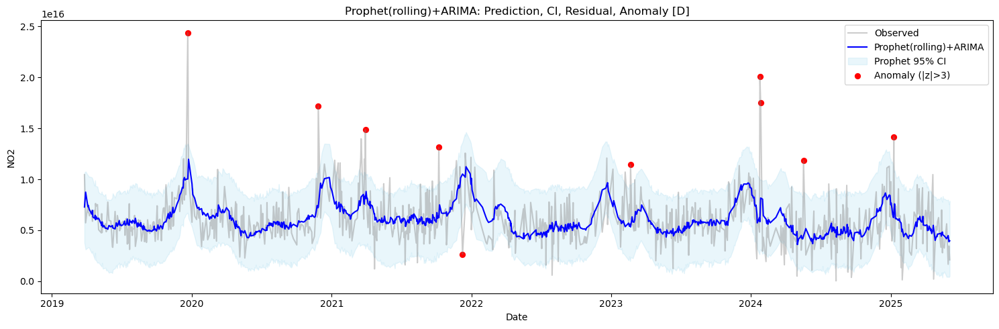

00:33:00 - cmdstanpy - INFO - Chain [1] start processing
00:33:00 - cmdstanpy - INFO - Chain [1] done processing
00:33:00 - cmdstanpy - INFO - Chain [1] start processing
00:33:00 - cmdstanpy - INFO - Chain [1] done processing
00:33:00 - cmdstanpy - INFO - Chain [1] start processing
00:33:00 - cmdstanpy - INFO - Chain [1] done processing
00:33:00 - cmdstanpy - INFO - Chain [1] start processing
00:33:00 - cmdstanpy - INFO - Chain [1] done processing
00:33:00 - cmdstanpy - INFO - Chain [1] start processing
00:33:00 - cmdstanpy - INFO - Chain [1] done processing
00:33:00 - cmdstanpy - INFO - Chain [1] start processing
00:33:00 - cmdstanpy - INFO - Chain [1] done processing
00:33:01 - cmdstanpy - INFO - Chain [1] start processing
00:33:01 - cmdstanpy - INFO - Chain [1] done processing
00:33:01 - cmdstanpy - INFO - Chain [1] start processing
00:33:01 - cmdstanpy - INFO - Chain [1] done processing
00:33:01 - cmdstanpy - INFO - Chain [1] start processing
00:33:01 - cmdstanpy - INFO - Chain [1]

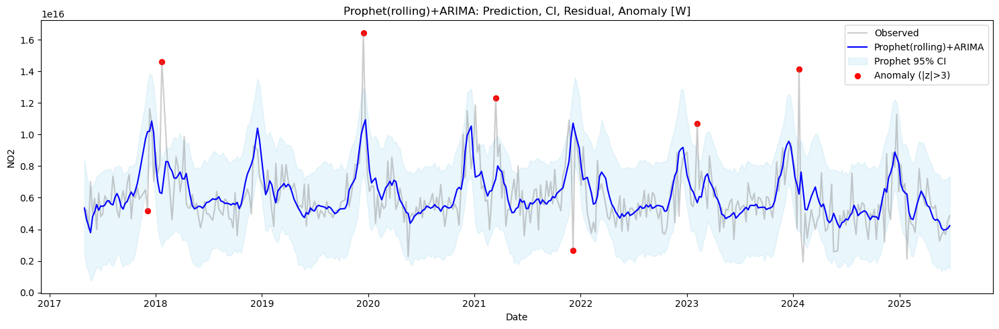

00:33:21 - cmdstanpy - INFO - Chain [1] start processing
00:33:21 - cmdstanpy - INFO - Chain [1] done processing
00:33:21 - cmdstanpy - INFO - Chain [1] start processing
00:33:22 - cmdstanpy - INFO - Chain [1] done processing
00:33:22 - cmdstanpy - INFO - Chain [1] start processing
00:33:22 - cmdstanpy - INFO - Chain [1] done processing
00:33:22 - cmdstanpy - INFO - Chain [1] start processing
00:33:22 - cmdstanpy - INFO - Chain [1] done processing
00:33:22 - cmdstanpy - INFO - Chain [1] start processing
00:33:22 - cmdstanpy - INFO - Chain [1] done processing
00:33:22 - cmdstanpy - INFO - Chain [1] start processing
00:33:23 - cmdstanpy - INFO - Chain [1] done processing
00:33:23 - cmdstanpy - INFO - Chain [1] start processing
00:33:23 - cmdstanpy - INFO - Chain [1] done processing
00:33:23 - cmdstanpy - INFO - Chain [1] start processing
00:33:23 - cmdstanpy - INFO - Chain [1] done processing
00:33:23 - cmdstanpy - INFO - Chain [1] start processing
00:33:24 - cmdstanpy - INFO - Chain [1]

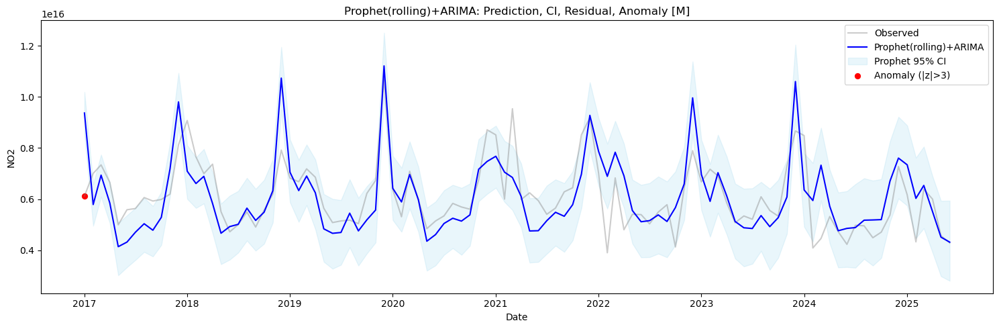

In [57]:
df_shi_daily_result_nasa = rolling_prophet_forecast_CI_with_arima(
    make_agg(df_shi_NASA, freq='D',pollutant='NO2'), pollutant='NO2',
    train_steps=730, test_steps=30, step=30, z_thresh=3, freq='D', plot=True
)
df_shi_weekly_result_nasa = rolling_prophet_forecast_CI_with_arima(
    make_agg(df_shi_NASA, freq='W',pollutant='NO2'), pollutant='NO2',
    train_steps=156, test_steps=8, step=4, z_thresh=3, freq='W', plot=True
)
df_shi_monthly_result_nasa = rolling_prophet_forecast_CI_with_arima(
    make_agg(df_shi_NASA, freq='M',pollutant='NO2'), pollutant='NO2',
    train_steps=36, test_steps=4, step=1, z_thresh=3, freq='M', plot=True
)

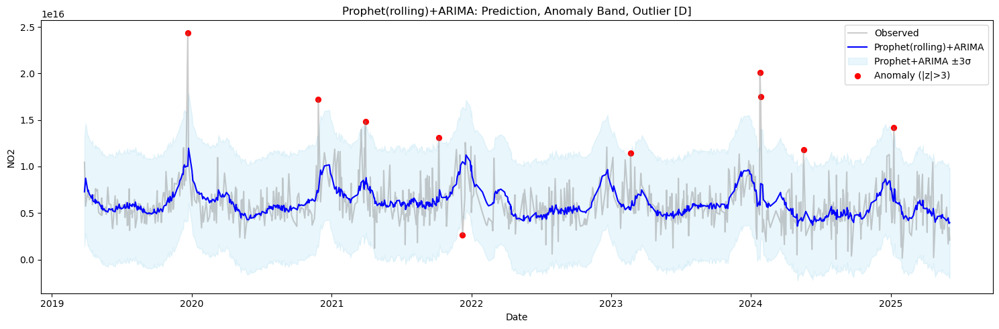

In [58]:
plot_arima_anomaly_band(df_shi_daily_result_nasa, pollutant='NO2', shading_k=3, z_thresh=3, freq='D')


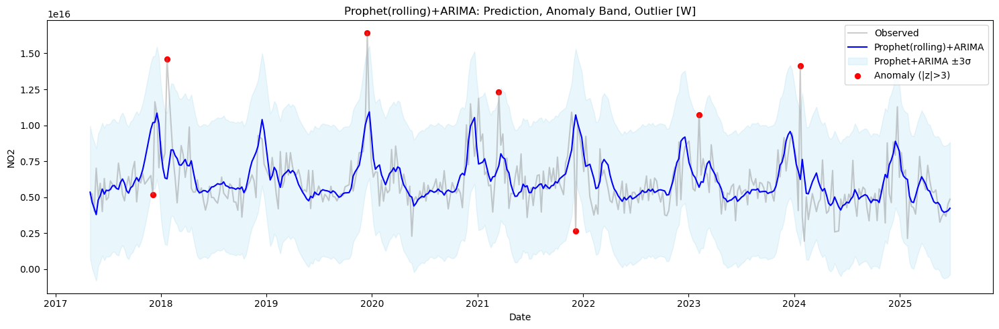

In [59]:
plot_arima_anomaly_band(df_shi_weekly_result_nasa, pollutant='NO2', shading_k=3, z_thresh=3, freq='W')


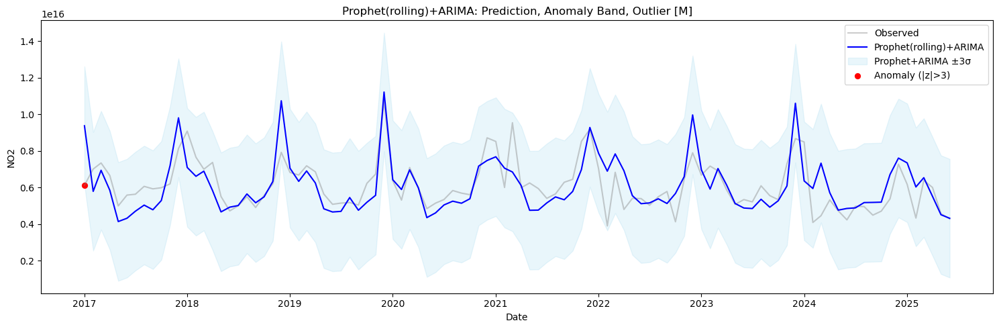

In [60]:
plot_arima_anomaly_band(df_shi_monthly_result_nasa, pollutant='NO2', shading_k=3, z_thresh=3, freq='M')


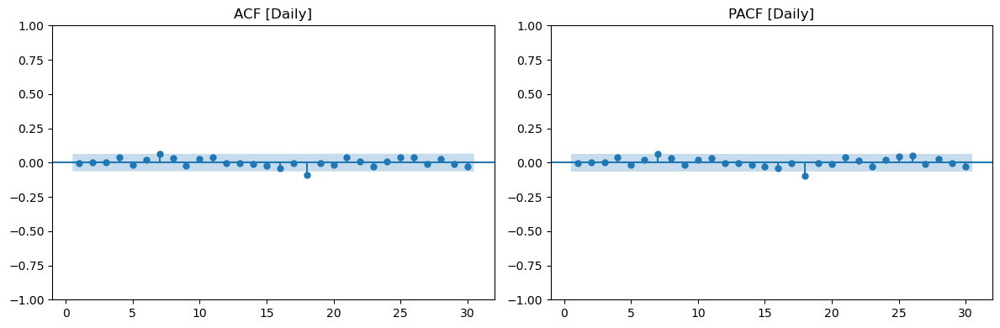

Ljung-Box Test [Daily] (using lags [10, 20, 30]):
      lb_stat  lb_pvalue
10   7.848948   0.643589
20  19.386727   0.496831
30  26.335327   0.657911



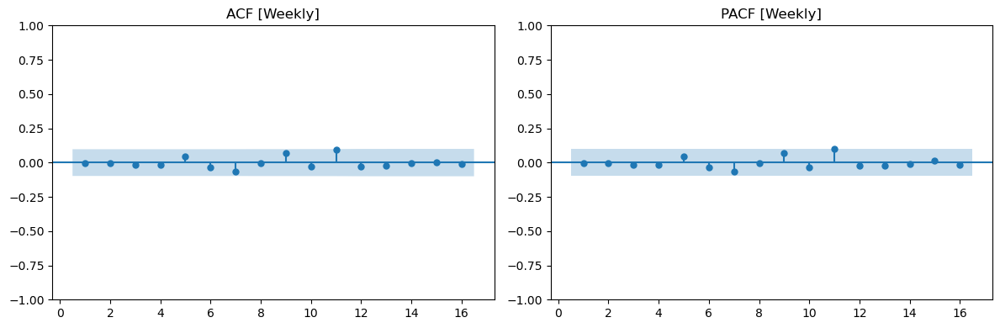

Ljung-Box Test [Weekly] (using lags [8, 12, 16]):
      lb_stat  lb_pvalue
8    3.311301   0.913331
12   9.766323   0.636453
16  10.029758   0.865070



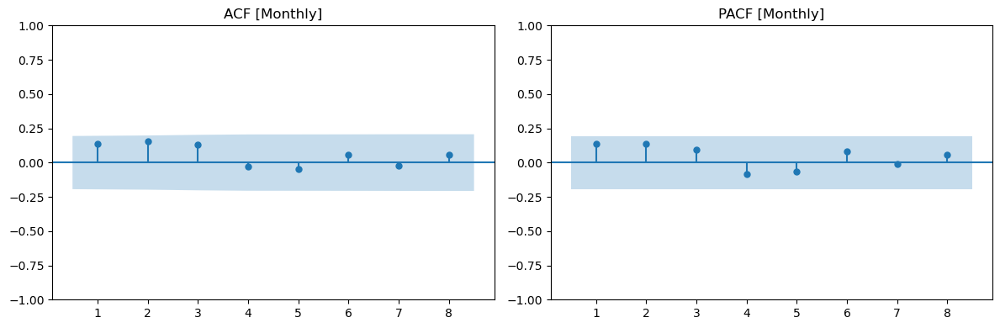

Ljung-Box Test [Monthly] (using lags [4, 8]):
    lb_stat  lb_pvalue
4  6.494807   0.165118
8  7.539408   0.479703



In [61]:
# Daily residual
residual_diagnostics(df_shi_daily_result_nasa, lags=[10,20,30], title='[Daily]')
# Weekly residual
residual_diagnostics(df_shi_weekly_result_nasa, lags=[8,12,16], title='[Weekly]')
# Monthly residual
residual_diagnostics(df_shi_monthly_result_nasa, lags=[4,8], title='[Monthly]')

# Xiamen Port

In [62]:
df_xia_NASA = pd.read_csv('data/Port_NO2/Xiamen_Port.csv')
df_xia_NASA = cleaning_NASA_data(df_xia_NASA,'NO2')

00:34:57 - cmdstanpy - INFO - Chain [1] start processing
00:34:58 - cmdstanpy - INFO - Chain [1] done processing
00:34:58 - cmdstanpy - INFO - Chain [1] start processing
00:34:58 - cmdstanpy - INFO - Chain [1] done processing
00:34:58 - cmdstanpy - INFO - Chain [1] start processing
00:34:58 - cmdstanpy - INFO - Chain [1] done processing
00:34:58 - cmdstanpy - INFO - Chain [1] start processing
00:34:58 - cmdstanpy - INFO - Chain [1] done processing
00:34:58 - cmdstanpy - INFO - Chain [1] start processing
00:34:58 - cmdstanpy - INFO - Chain [1] done processing
00:34:59 - cmdstanpy - INFO - Chain [1] start processing
00:34:59 - cmdstanpy - INFO - Chain [1] done processing
00:34:59 - cmdstanpy - INFO - Chain [1] start processing
00:34:59 - cmdstanpy - INFO - Chain [1] done processing
00:34:59 - cmdstanpy - INFO - Chain [1] start processing
00:34:59 - cmdstanpy - INFO - Chain [1] done processing
00:34:59 - cmdstanpy - INFO - Chain [1] start processing
00:34:59 - cmdstanpy - INFO - Chain [1]

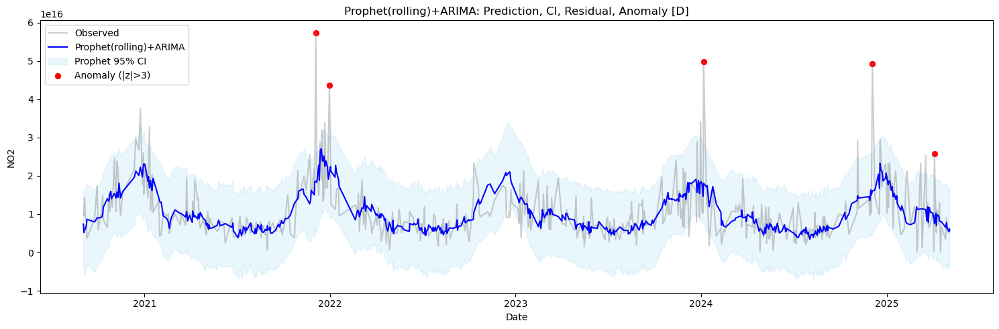

00:35:05 - cmdstanpy - INFO - Chain [1] start processing
00:35:05 - cmdstanpy - INFO - Chain [1] done processing
00:35:06 - cmdstanpy - INFO - Chain [1] start processing
00:35:06 - cmdstanpy - INFO - Chain [1] done processing
00:35:06 - cmdstanpy - INFO - Chain [1] start processing
00:35:06 - cmdstanpy - INFO - Chain [1] done processing
00:35:06 - cmdstanpy - INFO - Chain [1] start processing
00:35:06 - cmdstanpy - INFO - Chain [1] done processing
00:35:06 - cmdstanpy - INFO - Chain [1] start processing
00:35:06 - cmdstanpy - INFO - Chain [1] done processing
00:35:06 - cmdstanpy - INFO - Chain [1] start processing
00:35:06 - cmdstanpy - INFO - Chain [1] done processing
00:35:06 - cmdstanpy - INFO - Chain [1] start processing
00:35:06 - cmdstanpy - INFO - Chain [1] done processing
00:35:07 - cmdstanpy - INFO - Chain [1] start processing
00:35:07 - cmdstanpy - INFO - Chain [1] done processing
00:35:07 - cmdstanpy - INFO - Chain [1] start processing
00:35:07 - cmdstanpy - INFO - Chain [1]

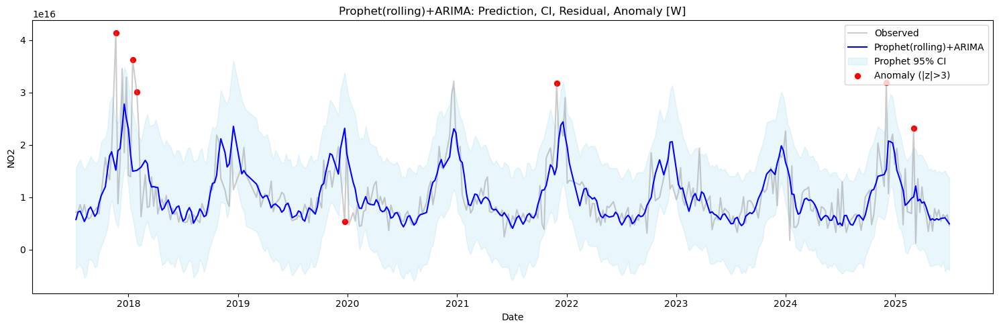

00:35:22 - cmdstanpy - INFO - Chain [1] start processing
00:35:22 - cmdstanpy - INFO - Chain [1] done processing
00:35:23 - cmdstanpy - INFO - Chain [1] start processing
00:35:23 - cmdstanpy - INFO - Chain [1] done processing
00:35:23 - cmdstanpy - INFO - Chain [1] start processing
00:35:23 - cmdstanpy - INFO - Chain [1] done processing
00:35:23 - cmdstanpy - INFO - Chain [1] start processing
00:35:23 - cmdstanpy - INFO - Chain [1] done processing
00:35:24 - cmdstanpy - INFO - Chain [1] start processing
00:35:24 - cmdstanpy - INFO - Chain [1] done processing
00:35:24 - cmdstanpy - INFO - Chain [1] start processing
00:35:24 - cmdstanpy - INFO - Chain [1] done processing
00:35:24 - cmdstanpy - INFO - Chain [1] start processing
00:35:24 - cmdstanpy - INFO - Chain [1] done processing
00:35:24 - cmdstanpy - INFO - Chain [1] start processing
00:35:25 - cmdstanpy - INFO - Chain [1] done processing
00:35:25 - cmdstanpy - INFO - Chain [1] start processing
00:35:25 - cmdstanpy - INFO - Chain [1]

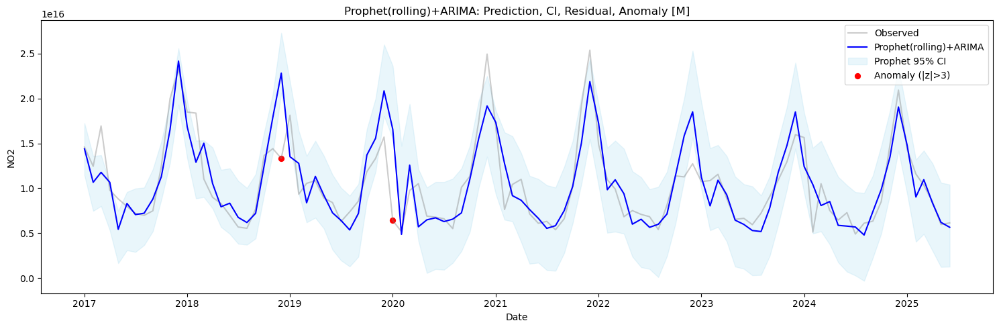

In [63]:
df_xia_daily_result_nasa = rolling_prophet_forecast_CI_with_arima(
    make_agg(df_xia_NASA, freq='D',pollutant='NO2'), pollutant='NO2',
    train_steps=730, test_steps=30, step=30, z_thresh=3, freq='D', plot=True
)
df_xia_weekly_result_nasa = rolling_prophet_forecast_CI_with_arima(
    make_agg(df_xia_NASA, freq='W',pollutant='NO2'), pollutant='NO2',
    train_steps=156, test_steps=8, step=4, z_thresh=3, freq='W', plot=True
)
df_xia_monthly_result_nasa = rolling_prophet_forecast_CI_with_arima(
    make_agg(df_xia_NASA, freq='M',pollutant='NO2'), pollutant='NO2',
    train_steps=36, test_steps=4, step=1, z_thresh=3, freq='M', plot=True
)

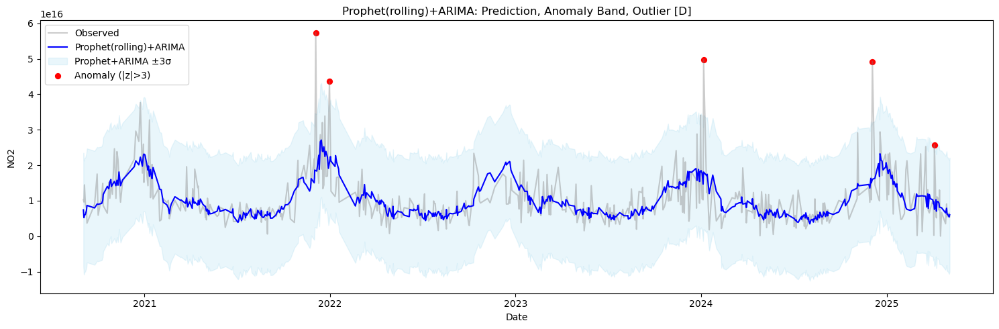

In [64]:
plot_arima_anomaly_band(df_xia_daily_result_nasa, pollutant='NO2', shading_k=3, z_thresh=3, freq='D')


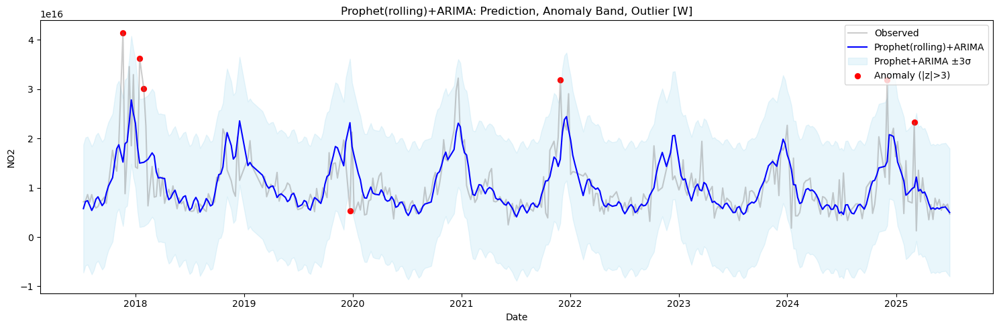

In [65]:
plot_arima_anomaly_band(df_xia_weekly_result_nasa, pollutant='NO2', shading_k=3, z_thresh=3, freq='W')


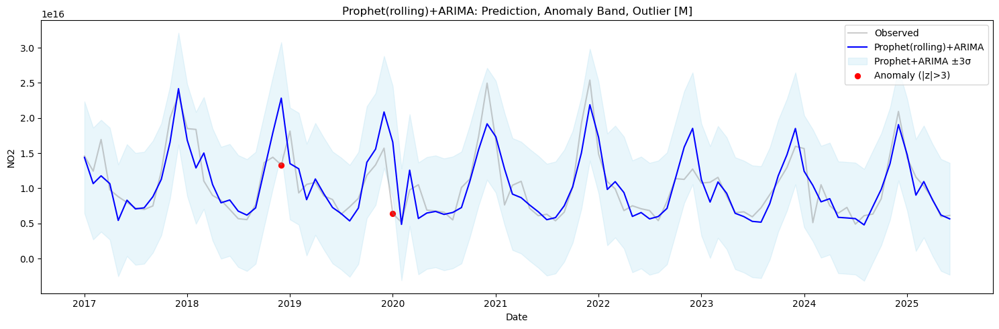

In [66]:
plot_arima_anomaly_band(df_xia_monthly_result_nasa, pollutant='NO2', shading_k=3, z_thresh=3, freq='M')


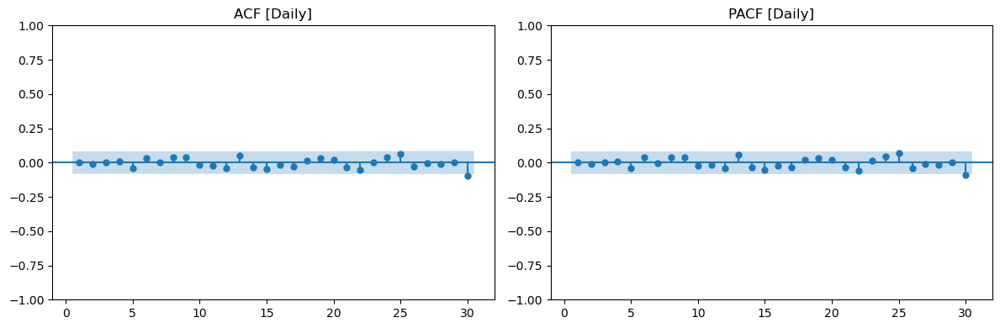

Ljung-Box Test [Daily] (using lags [10, 20, 30]):
      lb_stat  lb_pvalue
10   3.549048   0.965407
20  10.171277   0.964959
30  22.267001   0.844156



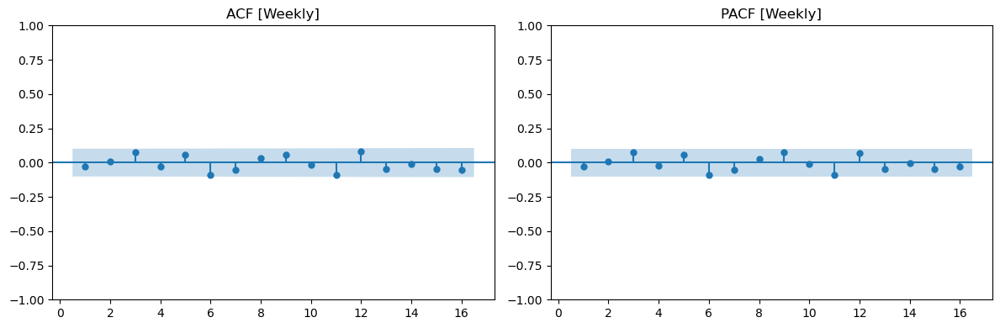

Ljung-Box Test [Weekly] (using lags [8, 12, 16]):
      lb_stat  lb_pvalue
8    8.647773   0.372875
12  15.763316   0.202319
16  18.560446   0.292114



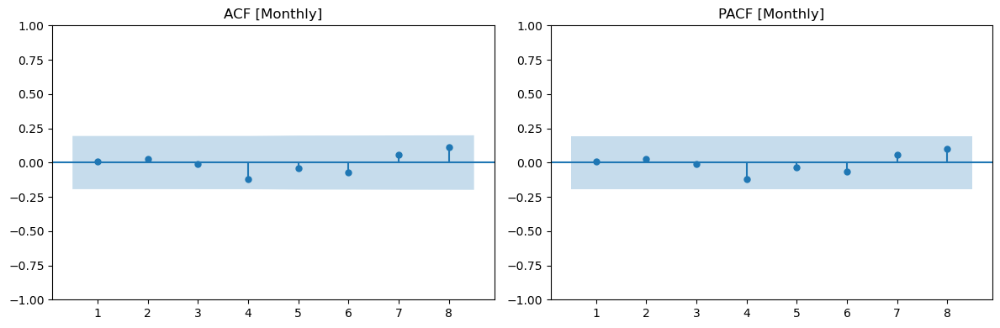

Ljung-Box Test [Monthly] (using lags [4, 8]):
    lb_stat  lb_pvalue
4  1.646920   0.800336
8  4.118136   0.846311



In [67]:
# Daily residual
residual_diagnostics(df_xia_daily_result_nasa, lags=[10,20,30], title='[Daily]')
# Weekly residual
residual_diagnostics(df_xia_weekly_result_nasa, lags=[8,12,16], title='[Weekly]')
# Monthly residual
residual_diagnostics(df_xia_monthly_result_nasa, lags=[4,8], title='[Monthly]')